#0.Objetivo

El principal objetivo es realizar un análisis exploratorio en el contexto de una empresa de seguros. Además, se debe realizar una clasificación binaria para poder predecir que pólizas harán un reclamo de siniestro y cuáles no. Todo el desarrollo deberá estar hecho en Python. Se facilitan dos datasets. El primero con información de las pólizas y el segundo con información de los vehículos. Ambos datasets están vinculados por el VEHICLE_ID En este primer notebook se realizará el EDA correspondiente

#1. Primera base: Vehicule info

## 1.1. Análisis previo de los datos

In [2]:
# Se realiza la descarga
#Libreria a usar
import pandas as pd
import csv

# Lee el archivo CSV con comillas como caracteres de cita y manejo de comas dentro de las comillas
vehicle_info = pd.read_csv('/content/vehicle_info.csv')


<ipython-input-2-ec04aeb182df>:7: DtypeWarning: Columns (3,5) have mixed types. Specify dtype option on import or set low_memory=False.
  vehicle_info = pd.read_csv('/content/vehicle_info.csv')


In [3]:
#se quiere ver la cantidad de datos
vehicle_info.shape


(222439, 7)

Se evidencia que hay 222439 filas y 7 columnas

In [4]:
# se ven las columnas
vehicle_info.columns

Index(['VEHICLE_ID', 'PROD_YEAR', 'SEATS_NUM', 'CARRYING_CAPACITY',
       'TYPE_VEHICLE', 'CCM_TON', 'MAKE'],
      dtype='object')

* VEHICLE_ID – Id del vehículo( variable numerica que servira como index)
* PROD_YEAR – Año de fabricación( variable numerica)
* SEATS_NUM – Cantidad de asientos ( variable numerica)
* CARRYING_CAPACITY – Capacidad de carga ( variable numerica)
* TYPE_VEHICLE – Tipo de vehículo ( variable categorica)
* CCM_TON – Potencia del motor( variable numerica)
* MAKE – Marca del vehículo ( variable categorica)

En este punto solo se busca entender si las variables son numericas o categoricas, mas adelante se entra en detalle de cada variable


In [6]:
# se ve las primeras 5 filas, con la intención de ver si esta viajando bien la informaciön
vehicle_info.head()

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
0,5000029885,2007.0,4.0,6.0,Pick-up,3153.0,NISSAN
1,5000029901,2010.0,4.0,7.0,Pick-up,2494.0,TOYOTA
2,5000030358,2012.0,0.0,220.0,Truck,12880.0,IVECO
3,5000031259,1999.0,11.0,0.0,Bus,2985.0,TOYOTA
4,5000031274,2000.0,12.0,12.0,Bus,2985.0,TOYOTA


## 1.2. Valores nulos

Se busca ver si hay datos nulos, primero se cuantos datos nulos hay y despues que porcentaje representa

### 1.2.1 Identificar valores nulos

In [7]:
# se ve por variable los datos nulos
vehicle_info.isnull().sum()

VEHICLE_ID               0
PROD_YEAR                4
SEATS_NUM               23
CARRYING_CAPACITY    48966
TYPE_VEHICLE             4
CCM_TON                  4
MAKE                     7
dtype: int64

In [8]:
# se ve porcentualmente
vehicle_info.isnull().sum()/vehicle_info.shape[0]

VEHICLE_ID           0.000000
PROD_YEAR            0.000018
SEATS_NUM            0.000103
CARRYING_CAPACITY    0.220132
TYPE_VEHICLE         0.000018
CCM_TON              0.000018
MAKE                 0.000031
dtype: float64

### 1.2.2 Imputacion de valores nulos

#### 1.2.2.1 PROD_YEAR

In [9]:
# se ven las filas nulas de PROD_YEAR
vehicle_info[vehicle_info['PROD_YEAR'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
54881,"5000373204,2011.0,4.0,,Automobile,1300.0,""ZOTY...",NaN,NaN,NaN,NaN,NaN,NaN
55192,"5000373181,2011.0,4.0,,Automobile,1299.0,""ZOYT...",NaN,NaN,NaN,NaN,NaN,NaN
193352,"5001130894,2017.0,0.0,400.0,Trailers and semit...",NaN,NaN,NaN,NaN,NaN,NaN
193353,"\n5001130924,2016.0,1.0,,Motor-cycle,150.0,SHN...",NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Con la intension de imputar se prueba primero con el index 54881
vehicle_info.iloc[54881]

VEHICLE_ID           5000373204,2011.0,4.0,,Automobile,1300.0,"ZOTY...
PROD_YEAR                                                          NaN
SEATS_NUM                                                          NaN
CARRYING_CAPACITY                                                  NaN
TYPE_VEHICLE                                                       NaN
CCM_TON                                                            NaN
MAKE                                                               NaN
Name: 54881, dtype: object

In [12]:
# se evidencia que la informacion esta en la primera columna
info=vehicle_info.iloc[54881][0]
info

'5000373204,2011.0,4.0,,Automobile,1300.0,"ZOTYE, NOMAD II"'

In [15]:
# se genera los nombres de las columnas
columnas=vehicle_info.columns
# Crear un lector CSV para manejar la información correctamente
reader = csv.reader([info])

# Extraer la fila de valores
valores = next(reader)

# Crear el DataFrame con un solo registro
df = pd.DataFrame([valores], columns=columnas)

df.iloc[0]

# vehicle_info.iloc[54881]
# se remplaza el valor en el index
vehicle_info.iloc[54881]=df.iloc[0]

# se verifica el cambio

vehicle_info.iloc[54881]

VEHICLE_ID                5000373204
PROD_YEAR                     2011.0
SEATS_NUM                        4.0
CARRYING_CAPACITY                   
TYPE_VEHICLE              Automobile
CCM_TON                       1300.0
MAKE                 ZOTYE, NOMAD II
Name: 54881, dtype: object

In [16]:
#se vuelve a ver los nulos

vehicle_info.isnull().sum() # es notorio que ahora hay 3 valores nulos

VEHICLE_ID               0
PROD_YEAR                3
SEATS_NUM               22
CARRYING_CAPACITY    48965
TYPE_VEHICLE             3
CCM_TON                  3
MAKE                     6
dtype: int64

In [17]:
# se vuelve a veriicar el index
vehicle_info[vehicle_info['PROD_YEAR'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
55192,"5000373181,2011.0,4.0,,Automobile,1299.0,""ZOYT...",NaN,NaN,NaN,NaN,NaN,NaN
193352,"5001130894,2017.0,0.0,400.0,Trailers and semit...",NaN,NaN,NaN,NaN,NaN,NaN
193353,"\n5001130924,2016.0,1.0,,Motor-cycle,150.0,SHN...",NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
# se aplica la misma logica previamente aplicada

info=vehicle_info.iloc[55192][0]
# Crear un lector CSV para manejar la información correctamente
reader = csv.reader([info])

# Extraer la fila de valores
valores = next(reader)

# Crear el DataFrame con un solo registro
df = pd.DataFrame([valores], columns=columnas)

vehicle_info.iloc[55192]=df.iloc[0]



In [19]:
# verificar cambio
vehicle_info.isnull().sum()

VEHICLE_ID               0
PROD_YEAR                2
SEATS_NUM               21
CARRYING_CAPACITY    48964
TYPE_VEHICLE             2
CCM_TON                  2
MAKE                     5
dtype: int64

In [20]:
vehicle_info[vehicle_info['PROD_YEAR'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
193352,"5001130894,2017.0,0.0,400.0,Trailers and semit...",NaN,NaN,NaN,NaN,NaN,NaN
193353,"\n5001130924,2016.0,1.0,,Motor-cycle,150.0,SHN...",NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
info=vehicle_info.iloc[193352][0]
# Crear un lector CSV para manejar la información correctamente
reader = csv.reader([info])

# Extraer la fila de valores
valores = next(reader)

# Crear el DataFrame con un solo registro
df = pd.DataFrame([valores], columns=columnas)
vehicle_info.iloc[193352]=df.iloc[0]



In [22]:
vehicle_info.isnull().sum() # solo queda un valor nulo

VEHICLE_ID               0
PROD_YEAR                1
SEATS_NUM               20
CARRYING_CAPACITY    48963
TYPE_VEHICLE             1
CCM_TON                  1
MAKE                     4
dtype: int64

In [23]:
vehicle_info[vehicle_info['PROD_YEAR'].isnull()] #

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
193353,"\n5001130924,2016.0,1.0,,Motor-cycle,150.0,SHN...",NaN,NaN,NaN,NaN,NaN,NaN


parece ser que hay mas de un id en esa columna, por tal motivo tambien interesa revisar el index 193354

In [24]:
#numeros a revisar
vehicle_info.iloc[193353] # revisar
vehicle_info.iloc[193354] # revisar, se evidencia que esta mal

VEHICLE_ID               017.0
PROD_YEAR                  2.0
SEATS_NUM                150.0
CARRYING_CAPACITY        Truck
TYPE_VEHICLE               0.0
CCM_TON              SINO HOWO
MAKE                       NaN
Name: 193354, dtype: object

In [25]:
info=vehicle_info.iloc[193353][0]
info # efectivamente hay mas de un registro en esa fila

'\n5001130924,2016.0,1.0,,Motor-cycle,150.0,SHNAY\n5001130926,2016.0,1.0,,Motor-cycle,150.0,SHNAY\n5001130931,2016.0,1.0,,Motor-cycle,150.0,SHNAY\n5001130936,2016.0,1.0,,Motor-cycle,150.0,SHNAY\n5001130937,1996.0,2.0,38.0,Truck,8226.0,ISUZU\n5001130994,2016.0,2.0,35.0,Truck,4570.0,ISUZU\n5001131005,2014.0,4.0,6.0,Pick-up,2494.0,TOYOTA\n5001130975,2015.0,0.0,220.0,Trailers and semitrailers,0.0,MESFIN\n5001130977,2015.0,1.0,180.0,Truck,12880.0,IVECO\n5001130982,2014.0,4.0,6.0,Pick-up,2494.0,TOYOTA\n5001131009,2015.0,0.0,180.0,Truck,12880.0,IVECO\n5001131013,2015.0,4.0,0.0,Automobile,1500.0,GLEEY\n5001131028,2013.0,4.0,6.0,Pick-up,2494.0,TOYOTA\n5001131029,1975.0,4.0,,Automobile,1686.0,MAZDA\n5001131035,2014.0,4.0,6.0,Pick-up,2494.0,TOYOTA\n5001131039,2014.0,4.0,6.0,Pick-up,2494.0,TOYOTA\n5001131045,2016.0,1.0,,Motor-cycle,110.0,BAJAJI\n5001131047,2016.0,1.0,0.0,Motor-cycle,183.0,SUZUKI\n5001131057,2017.0,1.0,4.5,Motor-cycle,395.0,BAJAJI\n5001131060,2017.0,2.0,0.0,Station Wagones,4461.0,T

In [26]:
# Dividir la cadena en filas utilizando '\n' como separador
filas_separadas = info.split('\n')

# Convertir la lista de filas separadas en un DataFrame
df1 = pd.DataFrame([x.split(',') for x in filas_separadas])

print(df1)

              0       1     2      3            4       5          6
0                  None  None   None         None    None       None
1    5001130924  2016.0   1.0         Motor-cycle   150.0      SHNAY
2    5001130926  2016.0   1.0         Motor-cycle   150.0      SHNAY
3    5001130931  2016.0   1.0         Motor-cycle   150.0      SHNAY
4    5001130936  2016.0   1.0         Motor-cycle   150.0      SHNAY
..          ...     ...   ...    ...          ...     ...        ...
653  5001129128  2014.0   3.0    0.0  Motor-cycle  198.75     BAJAJI
654  5001129059  2012.0   2.0  150.0        Truck     0.0        MAN
655  5001129347  2007.0   4.0          Automobile  1299.0     TOYOTA
656  5001129373  2017.0   2.0  150.0        Truck     0.0  SINO HOWO
657  5001129376          None   None         None    None       None

[658 rows x 7 columns]


In [27]:
# se selecciona desde la fila 2 y hasta la 656 que estan completas
df2=df1.iloc[1:657]
df2

,0,1,2,3,4,5,6
1,5001130924,2016.0,1.0,,Motor-cycle,150.0,SHNAY
2,5001130926,2016.0,1.0,,Motor-cycle,150.0,SHNAY
3,5001130931,2016.0,1.0,,Motor-cycle,150.0,SHNAY
4,5001130936,2016.0,1.0,,Motor-cycle,150.0,SHNAY
5,5001130937,1996.0,2.0,38.0,Truck,8226.0,ISUZU
...,...,...,...,...,...,...,...
652,5001128810,1999.0,4.0,6.0,Pick-up,1770.0,NISSAN
653,5001129128,2014.0,3.0,0.0,Motor-cycle,198.75,BAJAJI
654,5001129059,2012.0,2.0,150.0,Truck,0.0,MAN
655,5001129347,2007.0,4.0,,Automobile,1299.0,TOYOTA


In [28]:
df2.columns = vehicle_info.columns
df2

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
1,5001130924,2016.0,1.0,,Motor-cycle,150.0,SHNAY
2,5001130926,2016.0,1.0,,Motor-cycle,150.0,SHNAY
3,5001130931,2016.0,1.0,,Motor-cycle,150.0,SHNAY
4,5001130936,2016.0,1.0,,Motor-cycle,150.0,SHNAY
5,5001130937,1996.0,2.0,38.0,Truck,8226.0,ISUZU
...,...,...,...,...,...,...,...
652,5001128810,1999.0,4.0,6.0,Pick-up,1770.0,NISSAN
653,5001129128,2014.0,3.0,0.0,Motor-cycle,198.75,BAJAJI
654,5001129059,2012.0,2.0,150.0,Truck,0.0,MAN
655,5001129347,2007.0,4.0,,Automobile,1299.0,TOYOTA


In [29]:
vehicle_info = vehicle_info.drop(193353) # solo una vez
#vehicle_info.iloc[193353]

In [30]:
df3=pd.concat([vehicle_info, df2], axis=0)
df3

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
0,5000029885,2007.0,4.0,6.0,Pick-up,3153.0,NISSAN
1,5000029901,2010.0,4.0,7.0,Pick-up,2494.0,TOYOTA
2,5000030358,2012.0,0.0,220.0,Truck,12880.0,IVECO
3,5000031259,1999.0,11.0,0.0,Bus,2985.0,TOYOTA
4,5000031274,2000.0,12.0,12.0,Bus,2985.0,TOYOTA
...,...,...,...,...,...,...,...
652,5001128810,1999.0,4.0,6.0,Pick-up,1770.0,NISSAN
653,5001129128,2014.0,3.0,0.0,Motor-cycle,198.75,BAJAJI
654,5001129059,2012.0,2.0,150.0,Truck,0.0,MAN
655,5001129347,2007.0,4.0,,Automobile,1299.0,TOYOTA


In [31]:
vehicle_info.shape # se vuelve a ver el tamaño de data frame, es notorio que cambio

(222438, 7)

In [32]:
df4=df1.iloc[657]
df4[0]

'5001129376'

In [33]:
info=vehicle_info.iloc[193353]
info[5]

'SINO HOWO'

In [34]:
# ahora se soluciona el index  193354
dw = pd.DataFrame({'VEHICLE_ID ': [df4[0]],
                   'PROD_YEAR ': [2017.0],
                   'SEATS_NUM': [2.0],
                   'CARRYING_CAPACITY': [info[2]],
                   'TYPE_VEHICLE': [info[3]],
                   'CCM_TON ': [info[4]],
                   'MAKE': [info[5]]})

print(dw)

  VEHICLE_ID   PROD_YEAR   SEATS_NUM  CARRYING_CAPACITY TYPE_VEHICLE CCM_TON   \
0  5001129376      2017.0        2.0              150.0        Truck      0.0   

        MAKE  
0  SINO HOWO  


In [35]:
dw.iloc[0]

VEHICLE_ID           5001129376
PROD_YEAR                2017.0
SEATS_NUM                   2.0
CARRYING_CAPACITY         150.0
TYPE_VEHICLE              Truck
CCM_TON                     0.0
MAKE                  SINO HOWO
Name: 0, dtype: object

In [36]:
vehicle_info.iloc[193353]=dw.iloc[0]

In [37]:
vehicle_info.isnull().sum() # ya PROD_YEAR no tiene nulos

VEHICLE_ID               0
PROD_YEAR                0
SEATS_NUM               19
CARRYING_CAPACITY    48962
TYPE_VEHICLE             0
CCM_TON                  0
MAKE                     2
dtype: int64

####  1.2.2.2 MAKE

Se ven los 2 valores nulos de make

In [38]:
vehicle_info[vehicle_info['MAKE'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
145577,5000895027,2016.0,0.0,226.0,Trailers and semitrailers,0.0,NaN
182270,5001056748,2016.0,0.0,226.0,Trailers and semitrailers,0.0,NaN


In [39]:
# se ven los nombres de los trailes y semitrailes pues son los 2 tipos de vehiculos faltantes
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Trailers and semitrailers"
trai=vehicle_info.loc[trailers]
#trai.head

tt=trai.loc[(trai['PROD_YEAR'] == 2016) & (trai['CARRYING_CAPACITY'] == 226.0)& (trai['SEATS_NUM'] == 0.0)]
#trail=trai.loc[tt]
#trail.head
tt

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
359,5000031295,2016.0,0.0,226.0,Trailers and semitrailers,0.0,NAMI
2402,5000028265,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
8062,5000056923,2016.0,0.0,226.0,Trailers and semitrailers,0.0,NAMI
15505,5000078827,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
19759,5000108760,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
26847,5000156100,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
32884,5000179389,2016.0,0.0,226.0,Trailers and semitrailers,0.0,NAMI
33561,5000187354,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
47042,5000266266,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN
50700,5000353397,2016.0,0.0,226.0,Trailers and semitrailers,0.0,MESFIN


Dado que la marca que mas se repite es Mesfin, en los 2 datos faltantes se decide asiganar Mesfin

In [40]:
vehicle_info.iloc[145577][6]="MESFIN"
vehicle_info.iloc[182270][6]="MESFIN"

In [41]:
vehicle_info.isnull().sum()

VEHICLE_ID               0
PROD_YEAR                0
SEATS_NUM               19
CARRYING_CAPACITY    48962
TYPE_VEHICLE             0
CCM_TON                  0
MAKE                     0
dtype: int64

####  1.2.2.3 SEATS_NUM

In [42]:
# se ven las filas con seats num
vehicle_info[vehicle_info['SEATS_NUM'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
9470,5000055454,2007.0,NaN,100.0,Truck,0.0,IVECO
29254,5000171105,2000.0,NaN,NaN,Automobile,4160.0,1982
40709,5000230983,1969.0,NaN,NaN,Truck,0.0,ISUZU
47037,5000265563,2014.0,NaN,NaN,Automobile,2494.0,1982
83694,5000629239,2013.0,NaN,1.0,Tractor,0.0,AFRO
90019,5000650541,2014.0,NaN,NaN,Truck,0.0,ASTRA
90238,5000641665,1985.0,NaN,4.0,Automobile,0.0,PEUGEOT
90669,5000667799,2013.0,NaN,10.0,Automobile,0.0,LADA
92802,5000674589,2008.0,NaN,NaN,Bus,0.0,ISUZU
110867,5000737724,1986.0,NaN,0.0,Automobile,0.0,TOYOTA


In [43]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Truck"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['MAKE'] == "ISUZU")  | (trai['MAKE'] == "IVECO") | (trai['MAKE'] == "ASTRA")| (trai['MAKE'] == "SINO HOWO")]

tt

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
2,5000030358,2012.0,0.0,220.0,Truck,12880.0,IVECO
5,5000031283,1999.0,0.0,164.3,Truck,13798.0,IVECO
8,5000031488,2010.0,1.0,155.1,Truck,0.0,IVECO
9,5000031489,2010.0,1.0,155.1,Truck,0.0,IVECO
13,5000031479,2010.0,2.0,0.0,Truck,8226.0,ISUZU
...,...,...,...,...,...,...,...
222297,5001313459,2017.0,3.0,70.0,Truck,0.0,ISUZU
222304,5001313378,2017.0,1.0,132.0,Truck,8226.0,SINO HOWO
222325,5001313413,2017.0,1.0,132.0,Truck,8226.0,SINO HOWO
222337,5001310564,2017.0,1.0,132.0,Truck,9726.0,SINO HOWO


In [44]:
tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['MAKE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos pero eso se vera mas adelante

MAKE       ASTRA  ISUZU  IVECO  SINO HOWO
SEATS_NUM                                
0.0            3     62    148         84
1.0          247   1501   3176       4262
2.0          365  13720    602       1176
3.0           25     11      4          1
4.0            0     17      2          7
5.0            0     24      2          1
6.0            0      8      2          1
9.0            0      0      1          0
11.0           0      0      0          1


In [45]:
vehicle_info.iloc[9470][2]

nan

In [46]:
vehicle_info.iloc[9470][2]=1.0 #el struck marca iveco el valor que mas se repite es 1 por lo tanto es 1

In [47]:
vehicle_info.reset_index(drop=True, inplace=True)

In [48]:
vehicle_info[vehicle_info['SEATS_NUM'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
29254,5000171105,2000.0,NaN,NaN,Automobile,4160.0,1982
40709,5000230983,1969.0,NaN,NaN,Truck,0.0,ISUZU
47037,5000265563,2014.0,NaN,NaN,Automobile,2494.0,1982
83694,5000629239,2013.0,NaN,1.0,Tractor,0.0,AFRO
90019,5000650541,2014.0,NaN,NaN,Truck,0.0,ASTRA
90238,5000641665,1985.0,NaN,4.0,Automobile,0.0,PEUGEOT
90669,5000667799,2013.0,NaN,10.0,Automobile,0.0,LADA
92802,5000674589,2008.0,NaN,NaN,Bus,0.0,ISUZU
110867,5000737724,1986.0,NaN,0.0,Automobile,0.0,TOYOTA
136203,5000853409,2010.0,NaN,NaN,Automobile,0.0,TOYOTA


In [49]:
vehicle_info.iloc[40709][2]=2.0 # truck isuzu
vehicle_info.iloc[90019][2]=2.0 # truck astra
vehicle_info.iloc[141836][2]=2.0 # truck isuzu
vehicle_info.iloc[175133][2]=1.0 # truck iveco
vehicle_info.iloc[187919][2]=2.0 # truck isuzo
vehicle_info.iloc[202277][2]=1.0 # truck SINO HOWO

In [50]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Tractor"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['MAKE'] == "AFRO")]

tt

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
24893,5000125011,2009.0,0.0,0.0,Tractor,5000.0,AFRO
43229,5000262524,1985.0,1.0,0.0,Tractor,4750.0,AFRO
50702,5000353457,2012.0,1.0,1.0,Tractor,0.0,AFRO
53433,5000350498,1998.0,0.0,1.0,Tractor,0.0,AFRO
57010,5000401940,1996.0,0.0,1.0,Tractor,0.0,AFRO
...,...,...,...,...,...,...,...
218533,5001241545,2015.0,1.0,30.0,Tractor,0.0,AFRO
218733,5001245111,2017.0,0.0,1.0,Tractor,0.0,AFRO
218764,5001241133,2011.0,1.0,1.0,Tractor,6728.0,AFRO
221163,5001267623,2015.0,1.0,0.0,Tractor,0.0,AFRO


In [51]:
tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['MAKE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

MAKE       AFRO
SEATS_NUM      
0.0         434
1.0         153
2.0           8


In [52]:
vehicle_info.iloc[83694][2]=0.0 # trACTOR AFRO
vehicle_info.iloc[197723][2]=0.0 # trACTOR AFRO

In [53]:
vehicle_info[vehicle_info['SEATS_NUM'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
29254,5000171105,2000.0,NaN,NaN,Automobile,4160.0,1982
47037,5000265563,2014.0,NaN,NaN,Automobile,2494.0,1982
90238,5000641665,1985.0,NaN,4.0,Automobile,0.0,PEUGEOT
90669,5000667799,2013.0,NaN,10.0,Automobile,0.0,LADA
92802,5000674589,2008.0,NaN,NaN,Bus,0.0,ISUZU
110867,5000737724,1986.0,NaN,0.0,Automobile,0.0,TOYOTA
136203,5000853409,2010.0,NaN,NaN,Automobile,0.0,TOYOTA
184009,5001057314,1985.0,NaN,NaN,Automobile,0.0,NISSAN
187602,5001083909,2001.0,NaN,0.0,Bus,0.0,TOYOTA
211674,5001218704,1981.0,NaN,0.0,Automobile,0.0,LADA


In [54]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Bus"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['MAKE'] == "ISUZU")  | (trai['MAKE'] == "TOYOTA") ]

#tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['MAKE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

MAKE       ISUZU  TOYOTA
SEATS_NUM               
0.0            3      23
1.0           12      45
2.0            7      59
3.0            1      21
4.0            0     186
5.0            0     189
6.0            2      48
7.0            0      33
8.0            1     205
9.0            2      98
10.0           2      92
11.0          19    9847
12.0           0    1222
13.0           2     405
14.0           5    2097
15.0           2    1662
16.0           1     326
17.0           0      18
18.0           9      24
19.0           1      30
20.0          87      15
21.0          22      16
22.0           3     256
23.0           6      48
24.0        2723      82
25.0          67      40
26.0           1       7
27.0          12      16
28.0         816      23
29.0         253      81
30.0          13      59
31.0           6       2
32.0          14       4
33.0          13       1
40.0           4       6
41.0           1       0
42.0           1       1
44.0         492      10


In [55]:
vehicle_info.iloc[92802][2]=20.0 # BUS ISIZU
vehicle_info.iloc[187602][2]=11.0 # BUS TOYOTA

In [56]:
vehicle_info[vehicle_info['SEATS_NUM'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
29254,5000171105,2000.0,NaN,NaN,Automobile,4160.0,1982
47037,5000265563,2014.0,NaN,NaN,Automobile,2494.0,1982
90238,5000641665,1985.0,NaN,4.0,Automobile,0.0,PEUGEOT
90669,5000667799,2013.0,NaN,10.0,Automobile,0.0,LADA
110867,5000737724,1986.0,NaN,0.0,Automobile,0.0,TOYOTA
136203,5000853409,2010.0,NaN,NaN,Automobile,0.0,TOYOTA
184009,5001057314,1985.0,NaN,NaN,Automobile,0.0,NISSAN
211674,5001218704,1981.0,NaN,0.0,Automobile,0.0,LADA


In [57]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Automobile"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['MAKE'] == 1982)  | (trai['MAKE'] == "TOYOTA") | (trai['MAKE'] == "LADA")| (trai['MAKE'] == "NISSAN") | (trai['MAKE'] == "PEUGEOT")]

#tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['MAKE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

MAKE       LADA  NISSAN  PEUGEOT  TOYOTA
SEATS_NUM                               
0.0           1       8        3      94
1.0           0       0        1      16
2.0           0       0        1      11
3.0           0       6        1      35
4.0        1508     928      592   15424
5.0           0      73        6     271
6.0           0      49       19     243
7.0           0      40        8     139
8.0           0     108        2     370
9.0           0       9        1      63
10.0          0       3        0      21
11.0          1       0        0      76
12.0          0       0        0      10
13.0          0       0        0       4


In [58]:
# TODOS LOS AUTOS TIENES 4 PUESTO EN LA MODA
vehicle_info.iloc[29254][2]=4.0
vehicle_info.iloc[47037][2]=4.0
vehicle_info.iloc[90238][2]=4.0
vehicle_info.iloc[90669][2]=4.0
vehicle_info.iloc[110867][2]=4.0
vehicle_info.iloc[136203][2]=4.0
vehicle_info.iloc[184009][2]=4.0
vehicle_info.iloc[211674][2]=4.0

In [59]:
vehicle_info.isnull().sum()

VEHICLE_ID               0
PROD_YEAR                0
SEATS_NUM                0
CARRYING_CAPACITY    48962
TYPE_VEHICLE             0
CCM_TON                  0
MAKE                     0
dtype: int64

En este caso se hicieron las imputacion de manera " manual" porque era cortas, en el caso de  CARRYING_CAPACITY al ser tantos nulos hay que imputar de otra forma

####  1.2.2.4 CARRYING_CAPACITY

In [60]:
vehicle_info[vehicle_info['CARRYING_CAPACITY'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
12,5000031501,1993.0,5.0,NaN,Automobile,4164.0,TOYOTA
16,5000031506,1995.0,12.0,NaN,Automobile,4164.0,TOYOTA
17,5000031507,2000.0,7.0,NaN,Automobile,2779.0,TOYOTA
18,5000031508,1999.0,10.0,NaN,Automobile,4169.0,NISSAN
19,5000031510,1997.0,9.0,NaN,Automobile,4169.0,NISSAN
...,...,...,...,...,...,...,...
222400,5001333977,2017.0,1.0,NaN,Motor-cycle,171.0,BOXER
222406,5001330913,2018.0,4.0,NaN,Automobile,1600.0,BMW
222416,5001333448,2018.0,4.0,NaN,Automobile,1600.0,TOYOTA
222419,5001329256,2006.0,4.0,NaN,Automobile,1299.0,TOYOTA



Se imputan los datos, previamente se imputo por la moda del tipo de sillas por tipo de vehiculo y marca, dado que eran 19 se hizo de forma manual, para el caso de Carrying se va a hacer por formula pero con el mismo principio

In [61]:

# Calcular la moda de la edad para cada combinación de género y nivel educativo
moda_por_grupo = vehicle_info.groupby(['TYPE_VEHICLE', 'MAKE'])['CARRYING_CAPACITY'].apply(lambda x: x.mode()[0] if not x.mode().empty else None)

# Imputar los valores faltantes basados en la moda por grupo
vehicle_info['CARRYING_CAPACITY'] = vehicle_info.apply(lambda row: moda_por_grupo[(row['TYPE_VEHICLE'], row['MAKE'])] if pd.isnull(row['CARRYING_CAPACITY']) else row['CARRYING_CAPACITY'], axis=1)


<ipython-input-61-80edacc676e8>:2: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  moda_por_grupo = vehicle_info.groupby(['TYPE_VEHICLE', 'MAKE'])['CARRYING_CAPACITY'].apply(lambda x: x.mode()[0] if not x.mode().empty else None)
<ipython-input-61-80edacc676e8>:2: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  moda_por_grupo = vehicle_info.groupby(['TYPE_VEHICLE', 'MAKE'])['CARRYING_CAPACITY'].apply(lambda x: x.mode()[0] if not x.mode().empty else None)
<ipython-input-61-80edacc676e8>:2: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  moda_por_grupo = vehicle_info.groupby(['TYPE_VEHICLE', 'MAKE'])['CARRYING_CAPACITY'].apply(lambda x: x.mode()[0] if not x.mode().empty else None)
<ipython-input-61-80edacc676e8>:2: UserWarning: Unable to sort modes: '<' not supported between instances of 'str' and 'float'
  moda_por_grupo = vehicle_info.groupby(['TYPE_V

In [62]:
vehicle_info.isnull().sum()

VEHICLE_ID             0
PROD_YEAR              0
SEATS_NUM              0
CARRYING_CAPACITY    842
TYPE_VEHICLE           0
CCM_TON                0
MAKE                   0
dtype: int64

In [63]:
vehicle_info[vehicle_info['CARRYING_CAPACITY'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
641,5000024195,1999.0,1.0,None,Motor-cycle,183.0,MOTOR CYCLE (TWOCYCLE)
750,5000026109,2007.0,4.0,None,Automobile,2771.0,DACIA
800,5000029108,1997.0,4.0,None,Automobile,2466.0,GEEP
825,5000024197,1999.0,1.0,None,Motor-cycle,183.0,MOTOR CYCLE (TWOCYCLE)
882,5000024944,2007.0,6.0,None,Automobile,1590.0,DACIA
...,...,...,...,...,...,...,...
222311,5001316774,2018.0,4.0,None,Automobile,2000.0,FENGXING
222325,5001322735,2018.0,4.0,None,Automobile,1600.0,DFM
222358,5001323195,2018.0,4.0,None,Automobile,1600.0,BAIC AUTOMOBIL
222381,5001337766,2018.0,4.0,None,Automobile,1600.0,AUTOMOBILE


No se pudo imputar por marca  y tipo de vehiculo en estos 842 casos, por tal motivo se decide imputar solo por el tipo de vehiculo

In [64]:
# para esos 842 se aplica solo al tipo de vehiculo
# Calcular la moda de la edad para cada combinación de género y nivel educativo
moda_por_grupo = vehicle_info.groupby(['TYPE_VEHICLE'])['CARRYING_CAPACITY'].apply(lambda x: x.mode()[0] if not x.mode().empty else None)

# Imputar los valores faltantes basados en la moda por grupo
vehicle_info['CARRYING_CAPACITY'] = vehicle_info.apply(lambda row: moda_por_grupo[(row['TYPE_VEHICLE'])] if pd.isnull(row['CARRYING_CAPACITY']) else row['CARRYING_CAPACITY'], axis=1)


In [65]:
vehicle_info.isnull().sum()

VEHICLE_ID           0
PROD_YEAR            0
SEATS_NUM            0
CARRYING_CAPACITY    2
TYPE_VEHICLE         0
CCM_TON              0
MAKE                 0
dtype: int64

In [66]:
vehicle_info[vehicle_info['CARRYING_CAPACITY'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
50160,5000304696,2000.0,0.0,None,Trade plates,0.0,ZZ
50356,5000310842,2012.0,0.0,None,Trade plates,0.0,UNKNOWN


In [67]:
# a esas 2 les asigno 0

vehicle_info.iloc[50160][3]=0.0
vehicle_info.iloc[50356][3]=0.0

In [68]:
vehicle_info.isnull().sum()

VEHICLE_ID           0
PROD_YEAR            0
SEATS_NUM            0
CARRYING_CAPACITY    0
TYPE_VEHICLE         0
CCM_TON              0
MAKE                 0
dtype: int64

Ya no hay valores nulos

## 1.3. Revisión de la data

Despues de no tener valores nulos ahora corresponde ver si la informacion completa tiene sentido

###1.3.1.TYPE_VEHICLE

In [69]:
a=vehicle_info['TYPE_VEHICLE']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='TYPE_VEHICLE',y=b.index)
fig.show()

La informacion tiene sentido son 11 tipos de vehiculos, los vehiculos con mayor presencia son las motos.

Cade descatar los tipos de vehiculos:


*   Las Trade plates son placas especiales
*   Tanker, son los camiones que transportan gasolina
*  Tractor, es tractor
* Special contruction, son maquinas especiales de construccion
* Trailes y semitrailers, son los camiones de tranporte mas grandes
*  el station wagones, son los autos que tienen tres puestos mas en la parte de atras, tipo  BMW Serie 3
* truck son los camiones que transportan los trailers
* pick up, son las camionetas con cabina tracera, tipo la ranger de Ford
*  Bus
* Autos
* Motos



### 1.3.2.PROD_YEAR





Se grafican los años de produccion de los autos

In [70]:
a=vehicle_info['PROD_YEAR']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, y='PROD_YEAR',x=b.index)
fig.show()

In [71]:
# ver el vehiculo de año mas viejo
vehicle_info['PROD_YEAR'] = pd.to_numeric(vehicle_info['PROD_YEAR'], errors='coerce')
vehicle_info['PROD_YEAR'].min()

1950.0

In [72]:
trailers=vehicle_info.loc[:,'PROD_YEAR']==1950.0
trai=vehicle_info.loc[trailers]
trai


,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
23698,5000149704,1950.0,4.0,0.0,Automobile,1493.0,VOLKSWAGON
26967,5000160881,1950.0,2.0,8000.0,Tanker,0.0,FIAT
28464,5000158278,1950.0,1.0,20.0,Truck,4156.0,FIAT
86529,5000649066,1950.0,1.0,0.0,Truck,11548.0,FIAT
87162,5000639908,1950.0,1.0,30.4,Truck,5675.0,MERCEDES
90243,5000641709,1950.0,4.0,0.0,Automobile,1287.0,VOLKS WAGON
175850,5001035495,1950.0,1.0,97.0,Truck,0.0,FIAT
175851,5001035526,1950.0,0.0,120.0,Trailers and semitrailers,0.0,MARU
197627,5001159230,1950.0,1.0,0.0,Motor-cycle,150.0,BOXER
197804,5001155893,1950.0,1.0,0.0,Motor-cycle,125.0,TVS


Esta seria una pregunta a realizar, pero parece que los vehiculos as viejos son de 1950

In [73]:
# ver el vehiculo de año mas viejo
vehicle_info['PROD_YEAR'] = pd.to_numeric(vehicle_info['PROD_YEAR'], errors='coerce')
vehicle_info['PROD_YEAR'].max()

2018.0

In [74]:
trailers=vehicle_info.loc[:,'PROD_YEAR']==2018.0
trai=vehicle_info.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
741,5000025667,2018.0,0.0,220.0,Trailers and semitrailers,0.0,MESFIN
6398,5000036254,2018.0,1.0,0.0,Motor-cycle,150.0,BMW
24548,5000141099,2018.0,6.0,0.0,Station Wagones,2982.0,TOYOTA
54970,5000373874,2018.0,2.0,65.0,Truck,8226.0,ISUZU
82010,5000618905,2018.0,1.0,0.0,Motor-cycle,110.0,BOXER
...,...,...,...,...,...,...,...
222433,5001350484,2018.0,4.0,7.0,Pick-up,2400.0,TOYOTA
222434,5001350489,2018.0,4.0,7.0,Pick-up,2400.0,TOYOTA
222435,5001350498,2018.0,4.0,7.0,Pick-up,2400.0,TOYOTA
222436,5001350502,2018.0,4.0,7.0,Pick-up,2400.0,TOYOTA


Los vehiculos mas nuevos son del 2018, a pesar de los vehiculos viejos de 1950 , parace tener sentido la información

### 1.3.3.SEATS_NUM

Se busca ver en numero de sillas por vehiculos

In [75]:
a=vehicle_info['SEATS_NUM']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, y='SEATS_NUM',x=b.index)
fig.show()

In [76]:
b # arreglarlo

,SEATS_NUM
4.0,55743
1.0,46169
3.0,38039
2.0,25901
0.0,13743
...,...
170.0,1
161.0,1
158.0,1
93.0,1


In [77]:
# se quiere ver los vehiculos con 99 sillas, solo a manera de vista previa
trailers=vehicle_info.loc[:,'SEATS_NUM']==99
trai=vehicle_info.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
389,5000026414,1982.0,99.0,99.0,Bus,8650.0,DAF
442,5000025501,1982.0,99.0,99.0,Bus,8650.0,DAF
443,5000028856,1982.0,99.0,99.0,Bus,8650.0,DAF
444,5000028858,1982.0,99.0,99.0,Bus,8650.0,DAF
446,5000027181,1982.0,99.0,99.0,Bus,8650.0,DAF
...,...,...,...,...,...,...,...
197655,5001158316,2011.0,99.0,99.0,Bus,8650.0,DAF
199937,5001173889,2017.0,99.0,99.0,Bus,0.0,BISHOFTU
211834,5001215718,1982.0,99.0,99.0,Bus,0.0,DAF
213405,5001215709,1982.0,99.0,99.0,Bus,0.0,DAF


In [78]:
trailers=vehicle_info.loc[:,'SEATS_NUM']==158.0
trai=vehicle_info.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
1000,5000018211,2007.0,158.0,4.0,Automobile,1584.0,MITSUBISHI


In [88]:
vehicle_info.iloc[1000][2] # 158 no tiene sentido

158.0

In [89]:
#vehicle_info.iloc[1000][2]=4.0
#vehicle_info.iloc[1000][2]

In [80]:
vehicle_info['SEATS_NUM'] = pd.to_numeric(vehicle_info['SEATS_NUM'])

In [81]:
# se quiere ver el numero de sillas de los automoviles
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Automobile"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Automobile
SEATS_NUM               
0.0                  189
1.0                   50
2.0                   28
3.0                  162
4.0                27385
5.0                  921
6.0                  497
7.0                  240
8.0                  590
9.0                   84
10.0                  28
11.0                  83
12.0                  11
13.0                   4
158.0                  1


In [82]:
trailers=tt.loc[:,'SEATS_NUM']==13.0
trai=tt.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
11205,5000054243,2009.0,13.0,0.0,Automobile,4164.0,TOYOTA
11206,5000054244,2009.0,13.0,0.0,Automobile,4164.0,TOYOTA
66593,5000505674,2006.0,13.0,0.0,Automobile,4164.0,TOYOTA
123423,5000800730,2015.0,13.0,0.0,Automobile,7000.0,TOYOTA


se realiza la busqueda y si puede haber Toyota de 13 puestos, pues existe una combi marca Toyota

In [83]:
trailers=tt.loc[:,'SEATS_NUM']==1.0
trai=tt.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
11578,5000047179,1990.0,1.0,4.0,Automobile,1300.0,MITSUBISHI
24376,5000142950,1999.0,1.0,0.0,Automobile,1298.0,TOYOTA
26257,5000155000,2002.0,1.0,10.0,Automobile,796.0,DAMAS
31025,5000165049,2004.0,1.0,10.0,Automobile,796.0,DAMAS
44607,5000285895,1990.0,1.0,0.0,Automobile,796.0,DAEWOO
58282,5000405702,1990.0,1.0,0.0,Automobile,2366.0,TOYOTA
71650,5000558263,1990.0,1.0,0.0,Automobile,0.0,TOYOTA
73123,5000543346,2008.0,1.0,4.0,Automobile,796.0,HYUNDAI
79800,5000604448,1998.0,1.0,0.0,Automobile,800.0,DAEWOO
84369,5000614228,2006.0,1.0,350.0,Automobile,796.0,DAEWOO


no tiene sentido que un auto no tenga asientos o tenga 1 o 3
de 2 si puede ser porque hay autos pequeños

In [90]:
#df.loc[vehicle_info['SEATS_NUM'] == 'automovil', 'Columna'] = 4
# se remplazan las sillas de 0 y 1 por 4
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Automobile', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Automobile', 'SEATS_NUM'].replace({0.0: 4.0, 1.0: 4.0,158.0: 4.0})


In [91]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Automobile"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia)

TYPE_VEHICLE  Automobile
SEATS_NUM               
2.0                   28
3.0                  162
4.0                27625
5.0                  921
6.0                  497
7.0                  240
8.0                  590
9.0                   84
10.0                  28
11.0                  83
12.0                  11
13.0                   4


se asignan maximo 13 puestos a los automoviles, teniendo en cuenta en que pueden existir caminetas en el data set, se aplica ese mismo principio a los otros vehiculos

In [92]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Motor-cycle"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro una moto con 0 o con 11 puestos

TYPE_VEHICLE  Motor-cycle
SEATS_NUM                
0.0                  1132
1.0                 20006
2.0                   129
3.0                 37497
4.0                  3716
5.0                    93
6.0                    26
7.0                    14
8.0                     2
10.0                    2
11.0                    1


In [93]:
trailers=tt.loc[:,'SEATS_NUM']==5.0
trai=tt.loc[trailers]
trai

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
35952,5000204353,2011.0,5.0,5.0,Motor-cycle,499.0,BAJAJ
37313,5000203274,2010.0,5.0,5.0,Motor-cycle,499.0,BAJAJI
38145,5000235724,2010.0,5.0,5.0,Motor-cycle,499.0,BAJAJ
38486,5000227258,2011.0,5.0,5.0,Motor-cycle,499.0,BAJAJ
40913,5000232123,2000.0,5.0,5.0,Motor-cycle,0.0,BAJAJ
...,...,...,...,...,...,...,...
204382,5001175912,2017.0,5.0,5.0,Motor-cycle,499.0,BAJAJI
209488,5001195441,2017.0,5.0,5.0,Motor-cycle,250.0,BAJAJI
209909,5001197752,2017.0,5.0,0.0,Motor-cycle,499.0,BAJAJI
214520,5001226089,2017.0,5.0,0.0,Motor-cycle,395.0,FORCE


In [94]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Motor-cycle', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Motor-cycle', 'SEATS_NUM'].replace({0.0: 2.0, 4.0: 2.0, 5.0: 2.0, 6.0: 2.0, 7.0: 2.0, 8.0: 2.0, 10.0: 2.0, 11.0: 2.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Motor-cycle"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos



TYPE_VEHICLE  Motor-cycle
SEATS_NUM                
1.0                 20006
2.0                  5115
3.0                 37497


In [95]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Truck"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Truck
SEATS_NUM          
0.0             673
1.0           15731
2.0           21413
3.0              58
4.0              71
5.0              40
6.0              17
7.0               2
8.0               1
9.0               1
11.0              1
15.0              1
16.0              1
63.0              1
99.0              1
120.0             1


In [96]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Truck', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Truck', 'SEATS_NUM'].replace({0.0: 1.0, 3.0: 1.0, 4.0: 1.0, 5.0: 1.0, 6.0: 1.0, 7.0: 1.0, 8.0: 1.0, 9.0: 1.0, 11.0: 1.0, 15.0: 1.0, 16.0: 1.0, 63.0: 1.0, 99.0: 1.0, 120.0: 1.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Truck"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia)


TYPE_VEHICLE  Truck
SEATS_NUM          
1.0           16600
2.0           21413


In [97]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Pick-up"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia)

TYPE_VEHICLE  Pick-up
SEATS_NUM            
0.0               294
1.0              6207
2.0              2827
3.0                97
4.0             22167
5.0              1139
6.0                64
7.0                31
8.0                41
9.0                 2
10.0                5
11.0                9
12.0                1
14.0                2
15.0                2
23.0                1


In [98]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Pick-up', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Pick-up', 'SEATS_NUM'].replace({0.0: 1.0,6.0: 4.0, 7.0: 4.0, 8.0: 4.0, 9.0: 4.0, 10.0: 4.0, 11.0: 4.0, 12.0: 4.0, 14.0: 4.0, 15.0: 4.0, 23.0: 4.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Pick-up"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Pick-up
SEATS_NUM            
1.0              6501
2.0              2827
3.0                97
4.0             22325
5.0              1139


In [99]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Station Wagones"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Station Wagones
SEATS_NUM                    
0.0                       112
1.0                        59
2.0                        98
3.0                       122
4.0                      2045
5.0                       573
6.0                      1396
7.0                      1185
8.0                      4814
9.0                       797
10.0                      373
11.0                      678
12.0                      177
13.0                       38
14.0                        2
198.0                       1


In [100]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Station Wagones', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Station Wagones', 'SEATS_NUM'].replace({0.0: 8.0,9.0: 8.0, 10.0: 8.0, 11.0: 8.0, 12.0: 8.0, 13.0: 8.0, 14.0: 8.0, 198.0: 8.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Station Wagones"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Station Wagones
SEATS_NUM                    
1.0                        59
2.0                        98
3.0                       122
4.0                      2045
5.0                       573
6.0                      1396
7.0                      1185
8.0                      6992


In [101]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Trailers and semitrailers"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Trailers and semitrailers
SEATS_NUM                              
0.0                                8090
1.0                                  86
2.0                                  25
4.0                                   2
5.0                                   5
6.0                                   1
7.0                                   1
8.0                                   1
20.0                                  6
25.0                                  2
99.0                                  1


In [102]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Trailers and semitrailers', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Trailers and semitrailers', 'SEATS_NUM'].replace({1.0: 0.0,2.0: 0.0, 4.0: 0.0, 5.0: 0.0, 6.0: 0.0, 7.0: 0.0, 8.0: 0.0, 20.0: 0.0, 25.0: 0.0, 99.0: 0.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Trailers and semitrailers"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Trailers and semitrailers
SEATS_NUM                              
0.0                                8220


In [103]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Tractor"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Tractor
SEATS_NUM            
0.0              1863
1.0              1432
2.0                27
3.0                 2
4.0                 2
5.0                 8
11.0                1


In [104]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Tractor', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Tractor', 'SEATS_NUM'].replace({0.0: 1.0,3.0: 2.0, 4.0: 2.0, 5.0: 2.0, 11.0: 2.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Tractor"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Tractor
SEATS_NUM            
1.0              3295
2.0                40


In [105]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Tanker"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Tanker
SEATS_NUM           
0.0              147
1.0             1480
2.0              932
3.0               11
4.0                4
5.0               15
6.0                2
11.0               1
12.0               2
25.0               1


In [106]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Tanker', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Tanker', 'SEATS_NUM'].replace({0.0: 1.0,3.0: 2.0, 4.0: 2.0, 5.0: 2.0, 6.0: 2.0, 11.0: 2.0, 12.0: 2.0, 25.0: 2.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Tanker"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Tanker
SEATS_NUM           
1.0             1627
2.0              968


In [107]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Special construction"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Special construction
SEATS_NUM                         
0.0                           1195
1.0                            989
2.0                            321
3.0                             52
4.0                             89
5.0                            106
6.0                            144
7.0                             30
8.0                            335
9.0                             20
10.0                             6
11.0                            41
12.0                            16
13.0                             1
198.0                            1


In [108]:
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Special construction', 'SEATS_NUM']=vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Special construction', 'SEATS_NUM'].replace({0.0: 1.0,3.0: 2.0, 4.0: 2.0, 5.0: 2.0, 6.0: 2.0, 7.0: 2.0 , 8.0: 2.0, 9.0: 2.0,10.0: 2.0 ,11.0: 2.0, 12.0: 2.0, 13.0: 2.0, 198.0: 2.0})
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Special construction"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Special construction
SEATS_NUM                         
1.0                           2184
2.0                           1162


In [109]:
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Trade plates"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
print(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE  Trade plates
SEATS_NUM                 
0.0                      2


In [110]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Bus"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE,Bus
SEATS_NUM,
0.0,47
1.0,129
2.0,101
3.0,38
4.0,264
...,...
150.0,20
160.0,217
161.0,1


En el caso de los buses, las sillas pueden variar mucho mas, un bus Daf puede ser un bus de 2 pisos, pero por tema de clasificacion y de organizacion se decide agrupar en 4 grupos, 11 o menos,24 o menos , 45 o menos, o 99.

In [111]:
# Definir una función para mapear los valores de sillas solo para el tipo de vehículo "bus"
def agrupar_sillas(TYPE_VEHICLE, SEATS_NUM):
    if TYPE_VEHICLE == 'Bus':
        if SEATS_NUM <= 11:
            return 11
        elif SEATS_NUM <= 24:
            return 24
        elif SEATS_NUM <= 45:
            return 45
        else:
            return 99
    else:
        return SEATS_NUM

# Aplicar la función al DataFrame solo cuando el tipo de vehículo sea "bus"
vehicle_info.loc[vehicle_info['TYPE_VEHICLE'] == 'Bus', 'SEATS_NUM'] = vehicle_info[vehicle_info['TYPE_VEHICLE'] == 'Bus'].apply(lambda row: agrupar_sillas(row['TYPE_VEHICLE'], row['SEATS_NUM']), axis=1)


In [112]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Bus"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['SEATS_NUM'] >= 0.0) ]

tt

tabla_contingencia = pd.crosstab(tt['SEATS_NUM'],tt['TYPE_VEHICLE'])
(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

TYPE_VEHICLE,Bus
SEATS_NUM,
11.0,12208
24.0,9487
45.0,3647
99.0,3335


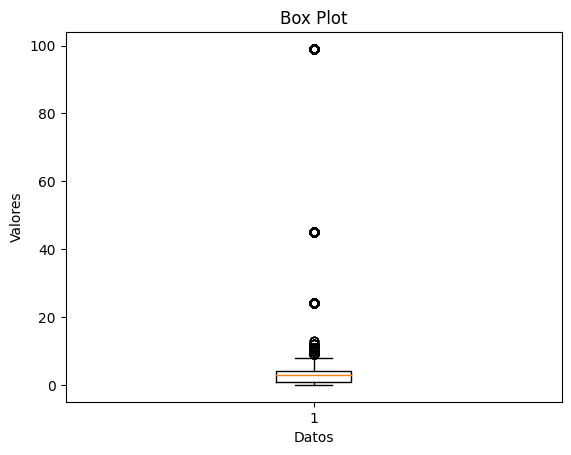

In [113]:
vehicle_info['SEATS_NUM'] = pd.to_numeric(vehicle_info['SEATS_NUM'], errors='coerce')
import matplotlib.pyplot as plt

# Crear el box plot
plt.boxplot(vehicle_info['SEATS_NUM'])

# Agregar etiquetas
plt.title('Box Plot')
plt.xlabel('Datos')
plt.ylabel('Valores')

# Mostrar el gráfico
plt.show()

In [114]:
tabla_contingencia = pd.crosstab(vehicle_info['SEATS_NUM'],vehicle_info['TYPE_VEHICLE'])
(tabla_contingencia)

TYPE_VEHICLE,Automobile,Bus,Motor-cycle,Pick-up,Special construction,Station Wagones,Tanker,Tractor,Trade plates,Trailers and semitrailers,Truck
SEATS_NUM,,,,,,,,,,,
0.0,0,0,0,0,0,0,0,0,2,8220,0
1.0,0,0,20006,6501,2184,59,1627,3295,0,0,16600
2.0,28,0,5115,2827,1162,98,968,40,0,0,21413
3.0,162,0,37497,97,0,122,0,0,0,0,0
4.0,27625,0,0,22325,0,2045,0,0,0,0,0
5.0,921,0,0,1139,0,573,0,0,0,0,0
6.0,497,0,0,0,0,1396,0,0,0,0,0
7.0,240,0,0,0,0,1185,0,0,0,0,0
8.0,590,0,0,0,0,6992,0,0,0,0,0


### 1.3.4.MAKE

In [115]:
# MARCAS
a=vehicle_info['MAKE']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
#fig = px.bar(b, x='MAKE',y=b.index)
#fig.show()

In [116]:
b

,MAKE
TOYOTA,67295
BAJAJI,35752
ISUZU,20584
NISSAN,7179
TVS,7122
...,...
ZOOMLIN CRANE,1
LIFAN 520,1
HANDLER FORCLIFT,1
HANDLER FORCIFT,1


In [ ]:
"""marca_counts = vehicle_info['MAKE'].value_counts()

# Convertir el resultado a un DataFrame
df_marca_counts = marca_counts.reset_index()

# Renombrar las columnas
df_marca_counts.columns = ['Marca', 'Cantidad']

# Ordenar por orden alfabético de marcas
df_marca_counts = df_marca_counts.sort_values(by='Marca')

(df_marca_counts)"""

es notorio que hay muchas marcas, es muy probable que exustan errores de nombres( previamente se abrio la anterior tabla con los 746 espacios para ver los errores), de forma manual se trato de arreglarlo (no se  arreglo el 100%)


In [117]:
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('T0Y0TA', 'TOYOTA', case=False)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('T0YATA', 'TOYOTA', case=False)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TOYATA', 'TOYOTA', case=False)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('COROLLA', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^TOYOTA', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TOYOTAA', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TOYTA', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'TOYOTA\*', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'TOYOTA\*', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'TOYOTA.*', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^NISSAN\*', 'NISSAN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^NISSAN.*', 'NISSAN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^NISAN.*', 'NISSAN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('^NISAN', 'NISSAN', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'TRAKKER', 'CHEVROLET', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'TRAKER', 'CHEVROLET', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'VOLKSWAGON', 'VOLKSWAGEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'VOLKS WAGON', 'VOLKSWAGEN', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^FORD\*', 'FORD', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^FORD.*', 'FORD', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^DAIHATSU.*', 'DAIHATSU', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^DAIHATSU.\*', 'DAIHATSU', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^DAIHATSU.*', 'DAIHATSU', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('r^DAIHATSU.\*', 'DAIHATSU', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^RENAULT.*', 'RENAULT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^RENAULT.\*', 'RENAULT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('RENALT', 'RENAULT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('RENUALT', 'RENAULT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LOGAN', 'RENAULT', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TOYOTA', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TOYATA ', 'TOYOTA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' TOYOTA', 'TOYOTA', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('VOLSVAGON', 'VOLKSWAGEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('VOLS WAGEN', 'VOLKSWAGEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('VOLS WAGON', 'VOLKSWAGEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('VOWS WAGEN', 'VOLKSWAGEN', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^MERCEDES.*', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^MERCEDES.\*', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MERCHEDES', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MERCEDIS', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MERCEDICE', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MERCEEDES', 'MERCEDES', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MERCEEDICE', 'MERCEDES', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^DAEWOO.*', 'DAEWOO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^DAEWOO.\*', 'DAEWOO', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DAWWO', 'DAEWOO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DEAWOO', 'DAEWOO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DAWWO', 'DAEWOO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DEAWOO USE', 'DAEWOO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DAWOO', 'DAEWOO', case=False, regex=True)




vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^PEUGEOT.*', 'PEUGEOT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(r'^PEUGEOT.\*', 'PEUGEOT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('PEUGEOUT', 'PEUGEOT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('PAGOT', 'PEUGEOT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('PEGO', 'PEUGEOT', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('PEJOT', 'PEUGEOT', case=False, regex=True)




vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('^KIA.*', 'KIA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('^KIA.\*', 'KIA', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('KIYA', 'KIA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAJAJI', 'BAJAJ', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAYBEN FIRE FIGHTER', 'BAYBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAYBEN HIGHBAD', 'BAYBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAYBEN HIGHBAD', 'BAYBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAYBEN HIGHBAD TRAILER', 'BAYBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BAYBEN TRUCK HIGHBED', 'BAYBEN', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' HERO', 'HERO', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS DAM', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS DAM TRUCK', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS DOSER', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS DOZER', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS TRUCK', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUSE TIPPER', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWRPLUS TRUCK', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUSP', 'WHEEL POWER PLUS', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LOADER', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LOADER POERR PLUS', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LOADER POWER PLUS', 'WHEEL POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LOADER POWERPLUS', 'WHEEL POWER PLUS', case=False, regex=True)




vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZONGUSHEN', 'ZONGSHEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOOM LION CRANE', 'ZOOMLIN CRANE', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOTYE, NOMAD II', 'ZOTYE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOYTE', 'ZOTYE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOYTE, NOMAD II', 'ZOTYE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA-ZOTYE', 'ZOTYE', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CATERPILLAR FORKLIFT', 'CATERPILLAR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CATERPILLAR FORKLIFTS', 'CATERPILLAR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CATERPILLAR TRACTOR', 'CATERPILLAR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CATERPLER', 'CATERPILLAR', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA - BBN', 'CHINA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA SELONG', 'CHINA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA SPECIAL POWER TRUCK', 'CHINA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA SPECIAL SEMI TRAILER', 'CHINA', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CHINA ZENGIZO', 'CHINA', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRAIN', 'CRANE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRAIN/TRUCK', 'CRANE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE LEBEHER', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE LEBHERER', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE TRUCK', 'CRANE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE ZOOMLIION', 'ZOOMLION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE ZOOMLION', 'ZOOMLION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE ZUMLIN', 'ZOOMLION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANE ZUMLIN ', 'ZOOMLION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANELEBHER', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANEZOOMLION', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CRANEXCMG', 'XCMG', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LEABER CATO CRANE', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LEBHER CRANE', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LIBER', 'LIEBHERR', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LIBER DOZER', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LIBERR MOBILE CRANE', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LIBERR MOBILECRANE', 'LIEBHERR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LIEBERR MOBILE CRANE', 'LIEBHERR', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GELYION', 'GELION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GENLION', 'GELION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GENLYON', 'GELION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('LGENLYONIVECO', 'GELION', case=False, regex=True)





vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GELYION', 'GELION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GENLION', 'GELION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('GENLYON', 'GELION', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHN DEER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHNDEER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHNDEER CAMECO/GRAP LOADER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JONDIR', 'JOHN DEERE', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHN DEER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHNDEER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHNDEER CAMECO/GRAP LOADER', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JONDIR', 'JOHN DEERE', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MISTIBUSH', 'MITSUBISHI', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MITSUBISHI*', 'MITSUBISHI', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MITSUBUSHI', 'MITSUBISHI', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTERCYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTOR CYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTOR CYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTOR CYCLE (TWOCYCLE)', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTOR CYLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTORCYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('M/CYCIE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('M/CYCLE', 'MOTORCYCLE', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANIA', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY CONCRETE', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY PALFINGER 23500B', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY PALFINGER STC250', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY PALFINGER STC500', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY PALFINGER STC750', 'SANY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SANY SY309C-8 MIXER', 'SANY', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRACTOR 4WD', 'TRACTOR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRACTOR BELARUS', 'TRACTOR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRACTOR TRAILER', 'TRACTOR', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRACTOR4WD', 'TRACTOR', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRAILED TANKER WITH FIRE EXTINGUISHER', 'TANKER', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TRAILED TANKKER WITH FIRE FIRE EXTINGUIS', 'TANKER', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOOMLIN CRANE', 'ZOOMLION', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOOMLION 70 TONE', 'ZOOMLION', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('CALABRASE', 'CALABRESE', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ISUSU', 'ISUZU', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ISUZU FVR', 'ISUZU', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ISUZU NPRP', 'ISUZU', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS POERR PLUS', 'POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS POWER PLUS', 'POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('POWER PLUS POWERPLUS', 'POWER PLUS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('PAWOR PLAS TIPPER', 'POWER PLUS', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACH', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHE RTR', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHERTE', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APPACH EBS', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APPACHE', 'APPACHE', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('NEW HOLAND', 'NEW HOLLAND', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('NAM', 'NAMI', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('NAMIE', 'NAMI', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHN DEEREEEEEEE', 'JOHN DEERE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('JOHN DEEREEEEEEEEEEEEEE CAMECO/GRAP POWER PLUS', 'JOHN DEERE', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' BEBIEN TANKER', 'BEBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BEBEN HIGHBAD', 'BEBEN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('BEBEN SEMI TRAILER', 'BEBEN', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' DONG FENG', 'DONGFENG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DONFING', 'DONGFENG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DONG FENGSHEN', 'DONGFENG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('DONGFANG', 'DONGFENG', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' FORK LIFT', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('FORKLIFT SHANTU', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('FORKLIFT', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' FORKLIFTS', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('FORKLIFTS', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('FORKLIFTSSSSS', 'FORKLIFTS', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('FORKLIFTSSSSSS', 'FORKLIFTS', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace(' MOTORCYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTOR CYCLE', 'MOTORCYCLE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('MOTORCYCLE (TWOCYCLE)', 'MOTORCYCLE', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZX-TOP', 'ZX TOP', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZZ', 'UNKNOWN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('*', 'UNKNOWN', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('HH', 'UNKNOWN', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ZOTYE, NOMAD II', 'ZOTYE', case=False, regex=True)



vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('3-AXLE DRAWBAR CARGO TRAILER	', 'TRAILER', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('3-AXEL DRAWBAR CARGO TRAILER', 'TRAILER', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('4WDTUAB TERES COPIC HANDLER', 'TRAILER',case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('2 AXEL LOWBED', 'TRAILER',case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('330-30 TRAILER', 'TRAILER',case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('1984', '1982',case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('1985', '1982',case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('3-AXLE DRAWBAR CARGO TRAILER', 'TRAILER', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('3-AXLE DRAWBAR CARGO TRAILER', 'TRAILER', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ACHIVE', 'HERO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ACHIVER', 'HERO', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ABAY', 'LIFAN', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ADDIS GEELY', 'GEELY', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ADDIS GELLY', 'GEELY', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('ADGE', 'FORD', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHEEE', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHEEEE', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHEEEE RTR', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APACHEEEERTE', 'APACHE', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('APPACHE', 'APACHE', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('305	ZOOMLION 70 TON', 'ZOOMLION', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('YOUTOGNMIDBUS', 'YUTONG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('YOUTONG', 'YUTONG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('YOUTONG BUS', 'YUTONG', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('YUTONG BUS', 'YUTONG', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('YTO TRACTOR', 'YTO', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('Volvo', 'VOLVO', case=False, regex=True)


vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SUZIKE', 'SUZUKI', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('STAYER', 'STEYER', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TELESCOPIC HANDLER', 'TELESCOPIC', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TELESCOPICFORKLIFTSSSS', 'TELESCOPIC', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TELESCOPIKFORKLIFTSSSS', 'TELESCOPIC', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('TELESCPIC HANDLER', 'TELESCOPIC', case=False, regex=True)

vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINO BISHOFTU', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINO CRANE', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINO HOWO', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINO TRUCK', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINOTRUCK', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINOTRUK', 'SINO', case=False, regex=True)
vehicle_info['MAKE'] = vehicle_info['MAKE'].str.replace('SINOTRUK HOWO', 'SINO', case=False, regex=True)



In [118]:
# MARCAS
a=vehicle_info['MAKE']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
#fig = px.bar(b, x='MAKE',y=b.index)
#fig.show()

In [119]:
b

,MAKE
TOYOTA,67442
BAJAJ,38326
ISUZU,20598
NISSAN,7345
TVS,7122
...,...
JAPAN,1
DIMAG CRANE,1
HYDROLIC,1
DIFENDER,1


si bien se disminuye a 553, es notorio que se puede mejorar mas

### 1.3.5.CCM_TON

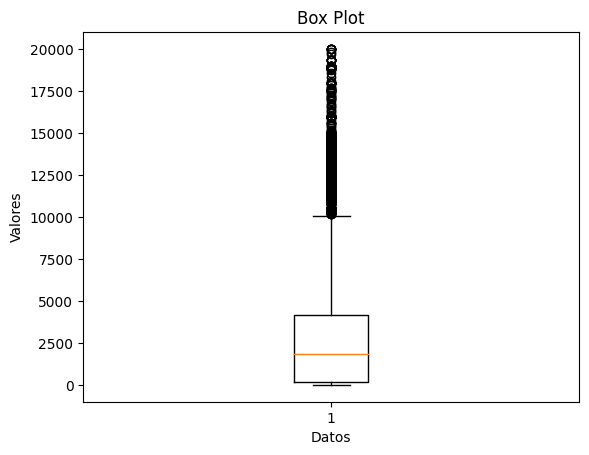

In [120]:
vehicle_info['CCM_TON'] = pd.to_numeric(vehicle_info['CCM_TON'], errors='coerce')

import matplotlib.pyplot as plt

# Crear el box plot
plt.boxplot(vehicle_info['CCM_TON'])

# Agregar etiquetas
plt.title('Box Plot')
plt.xlabel('Datos')
plt.ylabel('Valores')

# Mostrar el gráfico
plt.show()

In [121]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
trailers=vehicle_info.loc[:,'TYPE_VEHICLE']=="Automobile"
trai=vehicle_info.loc[trailers]
#tipe.head
#tt=tipe.loc[(tipe['MAKE'] == "ISUZU")]
tt=trai.loc[(trai['CCM_TON'] >= 10000.0) ]

tt

#tabla_contingencia = pd.crosstab(tt['CCM_TON'],tt['TYPE_VEHICLE'])
#(tabla_contingencia) # es raro un tractor con 0 o con 11 puestos

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
3446,5000020607,1987.0,4.0,0.0,Automobile,11498.0,LADA
26262,5000155061,1985.0,4.0,0.0,Automobile,12900.0,LADA
34397,5000190960,1981.0,4.0,0.0,Automobile,12000.0,LADA
57812,5000404680,1973.0,4.0,4.0,Automobile,13000.0,LADA
63737,5000474970,1984.0,4.0,4.0,Automobile,12900.0,TOYOTA
83884,5000611991,1989.0,4.0,0.0,Automobile,11998.0,LADA
88591,5000647237,1987.0,4.0,4.0,Automobile,11980.0,LADA
98364,5000689092,1982.0,4.0,4.0,Automobile,12900.0,TOYOTA
114079,5000756154,1975.0,4.0,4.0,Automobile,11970.0,FIAT
119859,5000790367,1998.0,4.0,0.0,Automobile,12950.0,TOYOTA



Es posible revisar mas este dato, pero se requiere alguien de producto que me explique mejor, a simple vista parace tener sentido



### 1.3.6.CARRYING_CAPACITY

In [122]:
import plotly.express as px
df = px.data.tips()
fig = px.box(vehicle_info, y="CARRYING_CAPACITY")
fig.show()

Dado que la mayoria de datos esta en 0, con la intension de que tenga mas sentido la informacion se decide agrupar por capacidad por medio de transporte y despues tomar el ultimo cuantil por tipo de transporte

In [123]:
vehicle_info['CARRYING_CAPACITY'] = pd.to_numeric(vehicle_info['CARRYING_CAPACITY'], errors='coerce')
filas_no_cero = vehicle_info[vehicle_info['CARRYING_CAPACITY'] != 0]
#filas_no_cero

#media_por_transporte = filas_no_cero.groupby('TYPE_VEHICLE')['CARRYING_CAPACITY'].mean()
#media_por_transporte[8]=0.0



media_por_transporte = vehicle_info.groupby('TYPE_VEHICLE')['CARRYING_CAPACITY'].mean().append(pd.Series({'Trade plates': 1.0}))
media_por_transporte

<ipython-input-123-133e705c2d8b>:10: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Automobile                       2.307381
Bus                             26.543324
Motor-cycle                      1.477876
Pick-up                          7.645051
Special construction           661.867926
Station Wagones                  2.743577
Tanker                       16345.056847
Tractor                         42.089916
Trade plates                     0.000000
Trailers and semitrailers     2394.274813
Truck                          171.046142
Trade plates                     1.000000
dtype: float64

In [128]:
vehicle_info['CARRYING_CAPACITY'] = pd.to_numeric(vehicle_info['CARRYING_CAPACITY'], errors='coerce')

In [129]:
vehicle_info['CARRYING_CAPACITY'] = vehicle_info.apply(lambda row: media_por_transporte[row['TYPE_VEHICLE']] if row['CARRYING_CAPACITY'] == 0 else row['CARRYING_CAPACITY'], axis=1)
#df['n'] = df.apply(lambda row: media_por_transporte[row['medio_de_transporte']] if row['n'] == 0 else row['n'], axis=1)


# Reemplazar los valores 0 en la columna 'n' con las medias calculadas, según el tipo de medio de transporte
#vehicle_info['CARRYING_CAPACITY'] = vehicle_info['CARRYING_CAPACITY'].mask(vehicle_info['CARRYING_CAPACITY'] == 0, media_por_transporte)

In [130]:
vehicle_info['CARRYING_CAPACITY'].head(5)
vehicle_info['CARRYING_CAPACITY'] = pd.to_numeric(vehicle_info['CARRYING_CAPACITY'], errors='coerce')


In [131]:

vehicle_info['CARRYING_CAPACITY'].max()

224000.0

In [132]:
ultimo_cuartil_por_tipo = vehicle_info.groupby('TYPE_VEHICLE')['CARRYING_CAPACITY'].quantile(0.75)
ultimo_cuartil_por_tipo

TYPE_VEHICLE
Automobile                       2.307381
Bus                             26.543324
Motor-cycle                      1.477876
Pick-up                         10.000000
Special construction           661.867926
Station Wagones                  2.743577
Tanker                       20000.000000
Tractor                         42.089916
Trade plates                          NaN
Trailers and semitrailers      400.000000
Truck                          171.046142
Name: CARRYING_CAPACITY, dtype: float64

In [133]:
for tipo, q3 in ultimo_cuartil_por_tipo.items():
    vehicle_info.loc[(vehicle_info['TYPE_VEHICLE'] == tipo) & (vehicle_info['CARRYING_CAPACITY'] >= q3), 'CARRYING_CAPACITY'] = q3


In [134]:
a=vehicle_info['CARRYING_CAPACITY']. value_counts()
b=a.to_frame()
b.columns
#import plotly.express as px
#fig = px.bar(b, y='CARRYING_CAPACITY',x=b.index)
#fig.show()

Index(['CARRYING_CAPACITY'], dtype='object')

In [135]:
b

,CARRYING_CAPACITY
1.477876,61647
2.307381,30242
26.543324,21906
171.046142,18624
7.000000,13958
...,...
116.600000,1
18670.000000,1
160.400000,1
31.700000,1


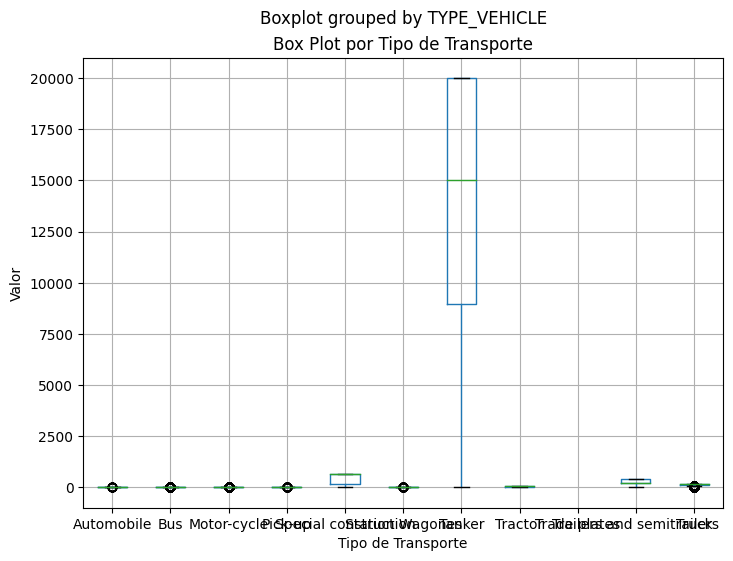

In [136]:
import matplotlib.pyplot as plt

# Supongamos que 'df' es tu DataFrame con las columnas 'Tipo de Transporte' y 'Valor'

# Crear una figura y ejes
plt.figure(figsize=(8, 6))

# Crear el box plot
vehicle_info.boxplot(column='CARRYING_CAPACITY', by='TYPE_VEHICLE', ax=plt.gca())

# Establecer etiquetas y título
plt.xlabel('Tipo de Transporte')
plt.ylabel('Valor')
plt.title('Box Plot por Tipo de Transporte')

# Mostrar el box plot
plt.show()

In [137]:
tabla_contingencia = pd.crosstab(vehicle_info['CARRYING_CAPACITY'],vehicle_info['TYPE_VEHICLE'])
tabla_contingencia

TYPE_VEHICLE,Automobile,Bus,Motor-cycle,Pick-up,Special construction,Station Wagones,Tanker,Tractor,Trailers and semitrailers,Truck
CARRYING_CAPACITY,,,,,,,,,,
1.000000,1,23,971,39,342,41,5,870,119,45
1.477876,0,0,61647,0,0,0,0,0,0,0
1.760000,0,0,0,0,1,0,0,0,0,0
1.920000,1,0,0,0,0,0,0,0,0,0
2.000000,27,23,0,36,6,30,2,0,0,376
...,...,...,...,...,...,...,...,...,...,...
19360.000000,0,0,0,0,0,0,2,0,0,0
19620.000000,0,0,0,0,0,0,1,0,0,0
19700.000000,0,0,0,0,0,0,3,0,0,0


#### 1.3.7. ultima revision

In [138]:
vehicle_info.isnull().sum()


VEHICLE_ID           0
PROD_YEAR            0
SEATS_NUM            0
CARRYING_CAPACITY    4
TYPE_VEHICLE         0
CCM_TON              0
MAKE                 0
dtype: int64

In [139]:
vehicle_info[vehicle_info['CARRYING_CAPACITY'].isnull()]

,VEHICLE_ID,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
50160,5000304696,2000.0,0.0,NaN,Trade plates,0.0,UNKNOWN
50356,5000310842,2012.0,0.0,NaN,Trade plates,0.0,UNKNOWN
54881,5000373204,2011.0,4.0,NaN,Automobile,1300.0,ZOTYE
55192,5000373181,2011.0,4.0,NaN,Automobile,1299.0,ZOTYE


In [140]:
vehicle_info['CARRYING_CAPACITY'] = vehicle_info['CARRYING_CAPACITY'].fillna(0)

In [142]:
vehicle_info.isnull().sum()

VEHICLE_ID           0
PROD_YEAR            0
SEATS_NUM            0
CARRYING_CAPACITY    0
TYPE_VEHICLE         0
CCM_TON              0
MAKE                 0
dtype: int64

In [143]:
vehicle_info_arreglada=vehicle_info
vehicle_info_arreglada.to_csv('vehicle_info_arreglada.csv')

#2. Segunda base: Insurance data

## 2.1. Analisis previo de los datos

In [146]:
import pandas as pd
import csv

# Lee el archivo CSV con comillas como caracteres de cita y manejo de comas dentro de las comillas
insurance_data = pd.read_csv('/content/insurance_data.csv')

In [147]:
#se quiere ver la cantidad de datos
insurance_data.shape


(406448, 11)

Se evidencia que hay 406448 filas y 7 columnas

In [148]:
# se ven las columnas
insurance_data.columns

Index(['POLICY_ID', 'INSR_BEGIN', 'INSR_END', 'CUSTOMER_SENIORITY', 'SEX',
       'INSR_TYPE', 'INSURED_VALUE', 'PREMIUM', 'VEHICLE_ID', 'USAGE',
       'CLAIM_PAID'],
      dtype='object')


* INSR_BEGIN – Fecha de inicio de la póliza (fecha)
* INSR_END – Fecha de fin de la póliza( fecha)
* CUSTOMER_SENIORITY – Antigüedad del cliente en la empresa ( numerica)
* SEX – Genero del cliente(categorica)
* INSR_TYPE – Tipo de póliza (categorica)
* INSURED_VALUE – Suma del valor asegurado(numerica)
* PREMIUM – Cuota a pagar por la póliza(numerica)
* VEHICLE_ID – Id del vehículo asegurado(numerica, pero de index)
* USAGE – Uso del vehículo asegurado(categorica)
* CLAIM_PAID – Pago realizado al cliente por un reclamo de siniestro. Si es nulo significa que no
hubo reclamo(numerica, se debe hacer otra columna que sera Y en el modelo)

En este punto solo se busca entender si las variables son numericas o categoricas, mas adelante se entra en detalle de cada variable

In [149]:
# se ve las primeras 5 filas, con la intención de ver si esta viajando bien la informaciön
insurance_data.head()

,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID
0,300226657,01-JUL-14,30-JUN-15,16,Female,1201,17000.0,163.20,5000546971,Private,NaN
1,300231460,01-JUL-14,30-JUN-15,1,Female,1202,2600000.0,45761.90,5000578640,Own service,30981.20
2,300046799,01-JUL-14,30-JUN-15,7,Female,1201,80000.0,907.20,5000059976,Private,NaN
3,300046807,01-JUL-14,30-JUN-15,0,Female,1201,225000.0,3690.55,5000059986,Private,NaN
4,300046812,01-JUL-14,30-JUN-15,1,Female,1202,950000.0,10441.89,5000059996,Own Goods,2167218.69


## 2.2. Valores nulos

Se busca ver si hay datos nulos, primero se cuantos datos nulos hay y despues que porcentaje representa

### 2.2.1 Identificar valores nulos

In [151]:
# se ve por variable los datos nulos
insurance_data.isnull().sum()

POLICY_ID                  0
INSR_BEGIN                 0
INSR_END                   0
CUSTOMER_SENIORITY         0
SEX                        0
INSR_TYPE                  0
INSURED_VALUE              0
PREMIUM                    9
VEHICLE_ID                 0
USAGE                      0
CLAIM_PAID            373408
dtype: int64

In [153]:
# se ve porcentualmente
insurance_data.isnull().sum()/insurance_data.shape[0]

POLICY_ID             0.000000
INSR_BEGIN            0.000000
INSR_END              0.000000
CUSTOMER_SENIORITY    0.000000
SEX                   0.000000
INSR_TYPE             0.000000
INSURED_VALUE         0.000000
PREMIUM               0.000022
VEHICLE_ID            0.000000
USAGE                 0.000000
CLAIM_PAID            0.918710
dtype: float64

### 2.2.2 Imputacion de valores nulos

#### 2.2.2.1 Premium

In [155]:
insurance_data[insurance_data['PREMIUM'].isnull()]

,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID
101025,300193123,24-MAY-15,23-MAY-16,2,Male,1201,0.00,NaN,5000461782,Private,NaN
139639,300340734,04-AUG-15,03-AUG-16,0,Female,1202,387196.76,NaN,5000786994,Agricultural Any Farm,NaN
139650,300340733,04-AUG-15,03-AUG-16,0,Female,1202,1370000.00,NaN,5000786971,Own service,NaN
139654,300340732,04-AUG-15,03-AUG-16,0,Female,1202,1370000.00,NaN,5000786966,Own service,NaN
139662,300340724,04-AUG-15,03-AUG-16,0,Female,1202,1735000.00,NaN,5000786916,Own service,NaN
212514,300322013,12-APR-16,11-APR-17,1,Female,1201,0.00,NaN,5000722545,Private,NaN
212518,300322016,12-APR-16,11-APR-17,1,Female,1201,0.00,NaN,5000722558,Private,NaN
244516,300262564,08-JUL-16,07-JUL-17,1,Female,1201,0.00,NaN,5000642166,Private,NaN
287561,300226941,18-OCT-16,17-OCT-17,12,Female,1202,450000.00,NaN,5000537871,Own Goods,NaN


In [156]:
# se reemplazan por 0 y en la parte de revision se verificara si tiene sentido

insurance_data.loc[insurance_data['PREMIUM'].isnull(), 'PREMIUM'] = 0

In [157]:
insurance_data.isnull().sum()

POLICY_ID                  0
INSR_BEGIN                 0
INSR_END                   0
CUSTOMER_SENIORITY         0
SEX                        0
INSR_TYPE                  0
INSURED_VALUE              0
PREMIUM                    0
VEHICLE_ID                 0
USAGE                      0
CLAIM_PAID            373408
dtype: int64

Ya no hay datos nulos

## 2.3 Revision de la data

Despues de no tener valores nulos ahora corresponde ver si la informacion completa tiene sentido

### 2.3.1.INSR_BEGIN y  INSR_BEGIN

In [159]:
insurance_data['INSR_BEGIN'] = pd.to_datetime(insurance_data['INSR_BEGIN'], format='%d-%b-%y')
insurance_data['INSR_END'] = pd.to_datetime(insurance_data['INSR_END'], format='%d-%b-%y')

dff = (insurance_data['INSR_END']  - insurance_data['INSR_BEGIN'] ).dt.days
dff

0         364
1         364
2         364
3         364
4         364
         ... 
406443    364
406444    364
406445    364
406446    364
406447    364
Length: 406448, dtype: int64

In [160]:
import plotly.express as px
df = px.data.tips()
fig = px.box(dff)
fig.show() # preguntar hay polizas por 1 dia

Es notorio que las fechas tienen sentido, pues no hay negativas, se evidencia que la mayoria de las polizas son de 1 año

### 2.3.2. CUSTOMER_SENIORITY




In [163]:
import plotly.express as px
df = px.data.tips()
fig = px.box(insurance_data, y="CUSTOMER_SENIORITY")
fig.show()

In [164]:
media = insurance_data['CUSTOMER_SENIORITY'].mean()
media

4.879979726803921

Genera un poco de duda el 63 pero, puede ser que alguien este desde que era pequeño, se podria consultar mejor la informacion de ese usario, sin embargo parace tener sentido.

La media de duracion de los usuarios en la compañia es de 4 años

### 2.3.3. SEX

In [161]:
a=insurance_data['SEX']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='SEX',y=b.index)
fig.show()

Esta bien la categoria sex, es notorio que la mayoria de los clientes son mujeres, sin embargo la diferencia es minima

### 2.3.4. INSR_TYPE

In [165]:
a=insurance_data['INSR_TYPE']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='INSR_TYPE',y=b.index)
fig.show()

Existen 3 tipos de polizas

### 2.3.5. INSURED_VALUE

In [166]:
import plotly.express as px
df = px.data.tips()
fig = px.box(insurance_data, y="INSURED_VALUE")
fig.show()

Es notaria la gran difencia entre los montos asegurados, consultaria por el valor de 67 millones pero puede tener sentido

### 2.3.6. USAGE

In [167]:
a=insurance_data['USAGE']. value_counts()
b=a.to_frame()
b.columns
import plotly.express as px
fig = px.bar(b, x='USAGE',y=b.index)
fig.show()

Existen 14 usos de los  vehículo asegurados, es notorio que la mayoria es de bienes propios.

### 2.3.7. CLAIM_PAID

In [168]:
import plotly.express as px
df = px.data.tips()
fig = px.box(insurance_data, y="CLAIM_PAID")
fig.show()

Los montos pagados son muy variados, pero tienen sentido

###2.3.8. PREMIUM

In [169]:
import plotly.express as px
df = px.data.tips()
fig = px.box(insurance_data, y="PREMIUM")
fig.show()

No tiene sentido que la cuota de la poliza a pagar sea 0, se decide cambiar el 0 por el siguiene valor mas pequeño por tipo usage


In [180]:
# Ordenar los valores por tipo de vehículo y pago de póliza
df_sorted = insurance_data.sort_values(by=['USAGE', 'PREMIUM'])

# Agregar el mínimo y el segundo mínimo por tipo de vehículo
minimos_por_grupo = df_sorted.groupby('USAGE')['PREMIUM'].agg([min, lambda x: x.unique()[1]])

# Renombrar las columnas para mayor claridad
minimos_por_grupo.columns = ['valor_minimo', 'segundo_valor_minimo']

# Imprimir los valores mínimos y segundos valores mínimos por tipo de vehículo
print(minimos_por_grupo)

                        valor_minimo  segundo_valor_minimo
USAGE                                                     
Agricultural Any Farm         35.000                57.500
Agricultural Own Farm         42.000                52.090
Ambulance                    622.250               628.500
Car Hires                    186.700               215.700
Fare Paying Passengers       191.764               215.700
Fire fighting                237.700               650.500
General Cartage               47.900               132.324
Learnes                       96.300               215.700
Others                        51.180               200.000
Own Goods                     12.120                21.310
Own service                   13.900                26.550
Private                       11.260                14.350
Special Construction           3.900                 5.000
Taxi                         206.100               215.700


In [179]:
# Función para reemplazar los valores de 0 por el segundo valor mínimo en cada grupo
def replace_zeros(group):
    # Encontrar el segundo valor mínimo (excluyendo los ceros)
    second_min = group[group != 0].nsmallest(2).iloc[-1]
    # Reemplazar los ceros por el segundo valor mínimo
    group[group == 0] = second_min
    return group

# Aplicar la función a cada grupo por tipo de vehículo
insurance_data['PREMIUM'] = insurance_data.groupby('USAGE')['PREMIUM'].apply(replace_zeros)


<ipython-input-179-ce4f8c25982f>:10: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [182]:
# Ordenar los valores por tipo de vehículo y pago de póliza
df_sorted = insurance_data.sort_values(by=['USAGE', 'PREMIUM'])

# Agregar el mínimo y el segundo mínimo por tipo de vehículo
minimos_por_grupo = df_sorted.groupby('USAGE')['PREMIUM'].agg([min, lambda x: x.unique()[1]])

# Renombrar las columnas para mayor claridad
minimos_por_grupo.columns = ['valor_minimo', 'segundo_valor_minimo']

# Imprimir los valores mínimos y segundos valores mínimos por tipo de vehículo
print(minimos_por_grupo)

                        valor_minimo  segundo_valor_minimo
USAGE                                                     
Agricultural Any Farm         35.000                57.500
Agricultural Own Farm         42.000                52.090
Ambulance                    622.250               628.500
Car Hires                    186.700               215.700
Fare Paying Passengers       191.764               215.700
Fire fighting                237.700               650.500
General Cartage               47.900               132.324
Learnes                       96.300               215.700
Others                        51.180               200.000
Own Goods                     12.120                21.310
Own service                   13.900                26.550
Private                       11.260                14.350
Special Construction           3.900                 5.000
Taxi                         206.100               215.700


In [181]:
import plotly.express as px
df = px.data.tips()
fig = px.box(insurance_data, y="PREMIUM")
fig.show()

In [183]:
insurance_data['PREMIUM'].min()

3.9

La informacion tiene sentido, se procede a unir los 2 dataste y hacer analisis descritivo que permita entender mejor la información.

#3.  Unión de la bases

##3.1 Union de las bases

In [184]:
insurance_data['VEHICLE_ID'] = insurance_data['VEHICLE_ID'].astype(int)
vehicle_info['VEHICLE_ID']=vehicle_info['VEHICLE_ID'].astype(int)

In [185]:
df_merged = pd.merge(insurance_data,vehicle_info, on='VEHICLE_ID', how='left')
df_merged

,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID,pago_poliza,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
0,300226657,2014-07-01,2015-06-30,16,Female,1201,17000.00,163.200,5000546971,Private,NaN,163.200,1980.0,1.0,1.477876,Motor-cycle,183.0,SUZUKI
1,300231460,2014-07-01,2015-06-30,1,Female,1202,2600000.00,45761.900,5000578640,Own service,30981.20,45761.900,2013.0,99.0,26.543324,Bus,9700.0,BISHOFTU
2,300046799,2014-07-01,2015-06-30,7,Female,1201,80000.00,907.200,5000059976,Private,NaN,907.200,1990.0,4.0,2.307381,Automobile,1300.0,TOYOTA
3,300046807,2014-07-01,2015-06-30,0,Female,1201,225000.00,3690.550,5000059986,Private,NaN,3690.550,2002.0,4.0,2.307381,Automobile,1299.0,MITSUBISHI
4,300046812,2014-07-01,2015-06-30,1,Female,1202,950000.00,10441.890,5000059996,Own Goods,2167218.69,10441.890,2004.0,1.0,6.000000,Pick-up,0.0,TOYOTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406443,300334494,2017-08-07,2018-08-06,1,Female,1202,695136.93,11279.320,5000778040,Own service,NaN,11279.320,2015.0,24.0,15.000000,Bus,4650.0,TOYOTA
406444,300119191,2017-08-07,2018-08-06,6,Female,1202,900000.00,10828.750,5000213479,Own Goods,NaN,10828.750,2007.0,4.0,7.000000,Pick-up,0.0,TOYOTA
406445,300046288,2017-08-07,2018-08-06,0,Female,1201,700000.00,9644.525,5000070876,Private,NaN,9644.525,2010.0,4.0,2.307381,Automobile,0.0,TOYOTA
406446,300256129,2017-08-07,2018-08-06,13,Female,1201,1500000.00,16694.150,5000626182,Private,NaN,16694.150,2004.0,4.0,2.743577,Station Wagones,2269.0,VOLKSWAGEN


In [186]:
df_merged[df_merged['CARRYING_CAPACITY'].isnull()] # se decide no tomar las filas donde no machean

,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID,pago_poliza,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
301921,300477803,2016-12-03,2017-12-02,0,Female,1201,0.00,216.850,5001111071,Private,NaN,216.850,NaN,NaN,NaN,NaN,NaN,NaN
310876,300477493,2016-12-28,2017-12-27,1,Female,1202,3000000.00,5459.280,5001131238,Own Goods,NaN,5459.280,NaN,NaN,NaN,NaN,NaN,NaN
314209,300477439,2017-01-01,2017-12-31,1,Female,1201,31739.13,761.098,5001130115,Private,NaN,761.098,NaN,NaN,NaN,NaN,NaN,NaN
314232,300477340,2017-01-01,2017-12-31,0,Female,1201,32127.95,400.769,5001130866,Private,NaN,400.769,NaN,NaN,NaN,NaN,NaN,NaN
314354,300477338,2017-01-01,2017-12-31,1,Female,1201,32127.95,405.769,5001130864,Private,NaN,405.769,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404300,300477309,2017-08-07,2018-08-06,2,Female,1202,1000000.00,11951.750,5001131028,Own Goods,NaN,11951.750,NaN,NaN,NaN,NaN,NaN,NaN
404301,300477305,2017-08-07,2018-08-06,0,Female,1202,1000000.00,11951.750,5001130982,Own Goods,NaN,11951.750,NaN,NaN,NaN,NaN,NaN,NaN
404303,300477302,2017-08-07,2018-08-06,2,Female,1202,1000000.00,11951.750,5001131005,Own Goods,NaN,11951.750,NaN,NaN,NaN,NaN,NaN,NaN
406069,300477990,2017-08-07,2018-08-06,1,Female,1201,5173185.65,55801.500,5001111492,Private,NaN,55801.500,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
df = df_merged.loc[df_merged['PROD_YEAR'].notnull()]
df

,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID,pago_poliza,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE
0,300226657,2014-07-01,2015-06-30,16,Female,1201,17000.00,163.200,5000546971,Private,NaN,163.200,1980.0,1.0,1.477876,Motor-cycle,183.0,SUZUKI
1,300231460,2014-07-01,2015-06-30,1,Female,1202,2600000.00,45761.900,5000578640,Own service,30981.20,45761.900,2013.0,99.0,26.543324,Bus,9700.0,BISHOFTU
2,300046799,2014-07-01,2015-06-30,7,Female,1201,80000.00,907.200,5000059976,Private,NaN,907.200,1990.0,4.0,2.307381,Automobile,1300.0,TOYOTA
3,300046807,2014-07-01,2015-06-30,0,Female,1201,225000.00,3690.550,5000059986,Private,NaN,3690.550,2002.0,4.0,2.307381,Automobile,1299.0,MITSUBISHI
4,300046812,2014-07-01,2015-06-30,1,Female,1202,950000.00,10441.890,5000059996,Own Goods,2167218.69,10441.890,2004.0,1.0,6.000000,Pick-up,0.0,TOYOTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406443,300334494,2017-08-07,2018-08-06,1,Female,1202,695136.93,11279.320,5000778040,Own service,NaN,11279.320,2015.0,24.0,15.000000,Bus,4650.0,TOYOTA
406444,300119191,2017-08-07,2018-08-06,6,Female,1202,900000.00,10828.750,5000213479,Own Goods,NaN,10828.750,2007.0,4.0,7.000000,Pick-up,0.0,TOYOTA
406445,300046288,2017-08-07,2018-08-06,0,Female,1201,700000.00,9644.525,5000070876,Private,NaN,9644.525,2010.0,4.0,2.307381,Automobile,0.0,TOYOTA
406446,300256129,2017-08-07,2018-08-06,13,Female,1201,1500000.00,16694.150,5000626182,Private,NaN,16694.150,2004.0,4.0,2.743577,Station Wagones,2269.0,VOLKSWAGEN


Se crea la columna Reclamo cuando esta el valor de  CLAIM_PAID

In [188]:
df['RECLAMO'] = df['CLAIM_PAID'].apply(lambda x: 0 if pd.isna(x) else 1)
df

<ipython-input-188-2d6373af592b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,POLICY_ID,INSR_BEGIN,INSR_END,CUSTOMER_SENIORITY,SEX,INSR_TYPE,INSURED_VALUE,PREMIUM,VEHICLE_ID,USAGE,CLAIM_PAID,pago_poliza,PROD_YEAR,SEATS_NUM,CARRYING_CAPACITY,TYPE_VEHICLE,CCM_TON,MAKE,RECLAMO
0,300226657,2014-07-01,2015-06-30,16,Female,1201,17000.00,163.200,5000546971,Private,NaN,163.200,1980.0,1.0,1.477876,Motor-cycle,183.0,SUZUKI,0
1,300231460,2014-07-01,2015-06-30,1,Female,1202,2600000.00,45761.900,5000578640,Own service,30981.20,45761.900,2013.0,99.0,26.543324,Bus,9700.0,BISHOFTU,1
2,300046799,2014-07-01,2015-06-30,7,Female,1201,80000.00,907.200,5000059976,Private,NaN,907.200,1990.0,4.0,2.307381,Automobile,1300.0,TOYOTA,0
3,300046807,2014-07-01,2015-06-30,0,Female,1201,225000.00,3690.550,5000059986,Private,NaN,3690.550,2002.0,4.0,2.307381,Automobile,1299.0,MITSUBISHI,0
4,300046812,2014-07-01,2015-06-30,1,Female,1202,950000.00,10441.890,5000059996,Own Goods,2167218.69,10441.890,2004.0,1.0,6.000000,Pick-up,0.0,TOYOTA,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406443,300334494,2017-08-07,2018-08-06,1,Female,1202,695136.93,11279.320,5000778040,Own service,NaN,11279.320,2015.0,24.0,15.000000,Bus,4650.0,TOYOTA,0
406444,300119191,2017-08-07,2018-08-06,6,Female,1202,900000.00,10828.750,5000213479,Own Goods,NaN,10828.750,2007.0,4.0,7.000000,Pick-up,0.0,TOYOTA,0
406445,300046288,2017-08-07,2018-08-06,0,Female,1201,700000.00,9644.525,5000070876,Private,NaN,9644.525,2010.0,4.0,2.307381,Automobile,0.0,TOYOTA,0
406446,300256129,2017-08-07,2018-08-06,13,Female,1201,1500000.00,16694.150,5000626182,Private,NaN,16694.150,2004.0,4.0,2.743577,Station Wagones,2269.0,VOLKSWAGEN,0


Se exporta la base de datos, para realizar el modelo

In [189]:
df
df.to_csv('df_train.csv')

## 3.2. Estadistica descriptiva

### 3.2.1 Sex

In [191]:
tabla_dinamica = pd.crosstab(df['SEX'], df['RECLAMO'], margins=True, margins_name='Total')

tabla_dinamica

RECLAMO,0,1,Total
SEX,,,
Female,191936,21840,213776
Male,181217,11182,192399
Total,373153,33022,406175


Se decide ver la tasa de accidente por sexo

In [192]:
tabla_dinamica = pd.crosstab(df['SEX'], df['RECLAMO'], normalize='index') * 100
tabla_dinamica = tabla_dinamica.round(2)  # Redondear los porcentajes a 2 decimales
tabla_dinamica

RECLAMO,0,1
SEX,,
Female,89.78,10.22
Male,94.19,5.81


En esta tabla parece que las mujeres tienen un indice de mayor accidentabilidad


In [193]:
# Convertir la tabla dinámica a un DataFrame para Plotly
df_grafico = tabla_dinamica.reset_index().melt(id_vars='SEX', var_name='RECLAMO', value_name='%')

# Crear el gráfico de barras con Plotly Express
fig = px.bar(df_grafico, x='SEX', y='%', color='RECLAMO', barmode='group',
             labels={'sexo': 'Sexo', '%': 'Porcentaje', 'Opción': 'Opción'})
fig.update_layout(title='Gráfico de barras: Porcentaje de elección entre opción 0 y 1 por sexo')
fig.show()

Se quiere ver cuanto pagan de poliza por sexo y cuanto es el promedio de pago la aseguradora cuando se accidentas las personas por sexo

In [194]:
tabla1 = df.groupby('SEX')['PREMIUM'].mean().reset_index()

print(tabla1)

      SEX      PREMIUM
0  Female  9294.683173
1    Male  6712.294127


In [195]:
tabla2 = df.groupby('SEX')['CLAIM_PAID'].mean().reset_index()

print(tabla2)

      SEX     CLAIM_PAID
0  Female  145370.073935
1    Male  442580.395220


In [196]:
tabla_final = tabla_dinamica.merge(tabla1, on='SEX').merge(tabla2, on='SEX')
print(tabla_final)

      SEX      0      1      PREMIUM     CLAIM_PAID
0  Female  89.78  10.22  9294.683173  145370.073935
1    Male  94.19   5.81  6712.294127  442580.395220


<ipython-input-198-129b7cbc9be7>:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



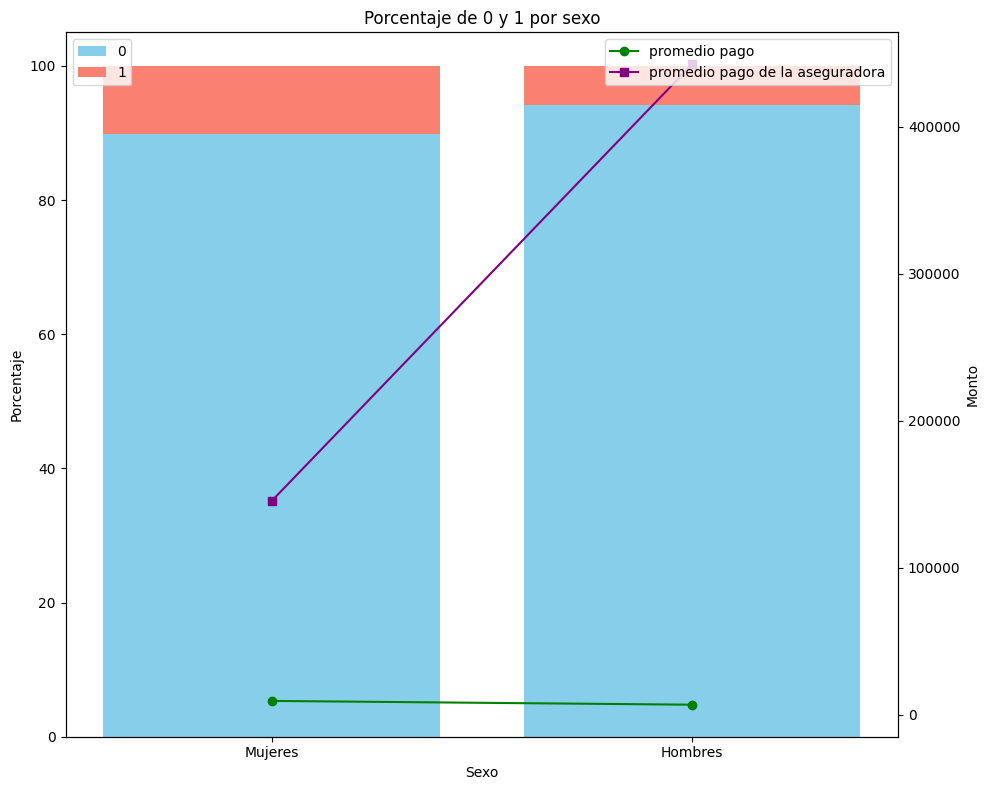

In [198]:
import numpy as np
import matplotlib.pyplot as plt

# Datos
sexos = ['Mujeres', 'Hombres']
valores_0 = [89.78, 94.19]
valores_1 = [10.22, 5.81]
premium = [9294.681304, 6712.292931]
claim_paid = [145370.073935, 442580.395220]

# Configuración del gráfico
fig, ax1 = plt.subplots(figsize=(10, 8))

# Eje izquierdo: Porcentaje de 0 y 1
ax1.bar(sexos, valores_0, label='0', color='skyblue')
ax1.bar(sexos, valores_1, bottom=valores_0, label='1', color='salmon')

# Etiquetas y título
ax1.set_ylabel('Porcentaje')
ax1.set_xlabel('Sexo')
ax1.set_title('Porcentaje de 0 y 1 por sexo')
ax1.set_xticklabels(sexos)

# Eje derecho: Premium y Claim Paid
ax2 = ax1.twinx()
ax2.plot(sexos, premium, label='promedio pago', color='green', marker='o')
ax2.plot(sexos, claim_paid, label='promedio pago de la aseguradora', color='purple', marker='s')
ax2.set_ylabel('Monto')
ax2.grid(False)

# Leyenda
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

De esta grafica se puede concluir que, el pago de poliza por seguro es similar y  a pesar de que las mujeres se accidentan mas, los gastos en los que incurre la aseguradora son menores, en pocas palabras, los hombres se accidentan menos pero cuando se accidentan son accidentes mas graves

### 3.2.2 INSR_TYPE(tipo de poliza)

In [202]:
tabla_dinamica = pd.crosstab(df['INSR_TYPE'], df['RECLAMO'], normalize='index') * 100
tabla_dinamica = tabla_dinamica.round(2)  # Redondear los porcentajes a 2 decimales
tabla_dinamica

RECLAMO,0,1
INSR_TYPE,,
1201,91.29,8.71
1202,92.06,7.94
1204,100.00,0.00


In [203]:
tabla1 = df.groupby('INSR_TYPE')['PREMIUM'].mean().reset_index()

print(tabla1)

   INSR_TYPE      PREMIUM
0       1201  5825.517906
1       1202  8804.628011
2       1204  1780.565571


In [204]:
tabla2 = df.groupby('INSR_TYPE')['CLAIM_PAID'].mean().reset_index()

print(tabla2)

   INSR_TYPE     CLAIM_PAID
0       1201  110355.480437
1       1202  294483.793113
2       1204            NaN


In [205]:
tabla_final = tabla_dinamica.merge(tabla1, on='INSR_TYPE').merge(tabla2, on='INSR_TYPE')
print(tabla_final)

   INSR_TYPE       0     1      PREMIUM     CLAIM_PAID
0       1201   91.29  8.71  5825.517906  110355.480437
1       1202   92.06  7.94  8804.628011  294483.793113
2       1204  100.00  0.00  1780.565571            NaN


La poliza de tipo 1202  tiene una cuota mensual mas alta pero tambien es mas alta su desembolso promedio

### 3.2.3 VALOR ASEGURADO

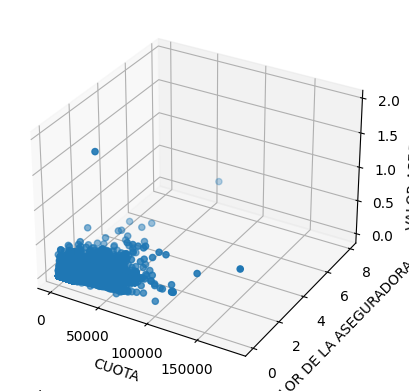

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Crear una figura y un eje 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Graficar los datos
ax.scatter(df['PREMIUM'], df['CLAIM_PAID'], df['INSURED_VALUE'])

# Etiquetas de los ejes
ax.set_xlabel('CUOTA')
ax.set_ylabel('VALOR DE LA ASEGURADORA')
ax.set_zlabel('VALOR ASEGURADO')

# Mostrar el gráfico
plt.show()

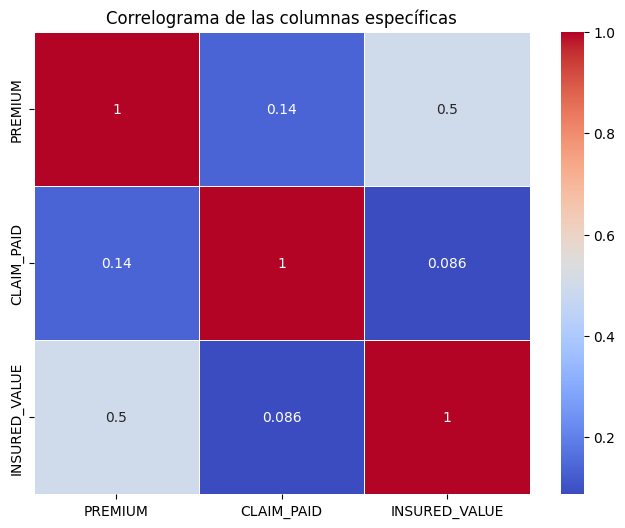

In [210]:
import seaborn as sns
columnas_especificas = ['PREMIUM','CLAIM_PAID', 'INSURED_VALUE']
df_especifico = df[columnas_especificas]

# Calcular la matriz de correlación para las tres columnas específicas
correlation_matrix = df_especifico.corr()

# Crear un mapa de calor para visualizar la matriz de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlograma de las columnas específicas')
plt.show()

Los 2 graficos muestran la alta correlacion entre el valor asegurado y el monto a pagado  en accidente

### 3.2.4 USAGE

In [211]:
tabla_dinamica = pd.crosstab(df['USAGE'], df['RECLAMO'], margins=True, margins_name='Total')

tabla_dinamica

RECLAMO,0,1,Total
USAGE,,,
Agricultural Any Farm,2044,40,2084
Agricultural Own Farm,4593,100,4693
Ambulance,1389,367,1756
Car Hires,1126,63,1189
Fare Paying Passengers,59903,4215,64118
Fire fighting,30,1,31
General Cartage,54734,5905,60639
Learnes,1421,44,1465
Others,5082,36,5118


In [212]:
tabla_dinamica = pd.crosstab(df['USAGE'], df['RECLAMO'], normalize='index') * 100
tabla_dinamica = tabla_dinamica.round(2)  # Redondear los porcentajes a 2 decimales
tabla_dinamica

RECLAMO,0,1
USAGE,,
Agricultural Any Farm,98.08,1.92
Agricultural Own Farm,97.87,2.13
Ambulance,79.10,20.90
Car Hires,94.70,5.30
Fare Paying Passengers,93.43,6.57
Fire fighting,96.77,3.23
General Cartage,90.26,9.74
Learnes,97.00,3.00
Others,99.30,0.70


In [213]:
tabla1 = df.groupby('USAGE')['PREMIUM'].mean().reset_index()

print(tabla1)

                     USAGE       PREMIUM
0    Agricultural Any Farm   9081.878446
1    Agricultural Own Farm   7938.428299
2                Ambulance  20436.213347
3                Car Hires   7457.342530
4   Fare Paying Passengers   6007.035872
5            Fire fighting  26014.824516
6          General Cartage  15864.039432
7                  Learnes   2671.255201
8                   Others    529.875890
9                Own Goods   7912.985511
10             Own service  10037.278822
11                 Private   5833.082243
12    Special Construction  11404.934860
13                    Taxi    954.449766


In [214]:
tabla2 = df.groupby('USAGE')['CLAIM_PAID'].mean().reset_index()

print(tabla2)


                     USAGE     CLAIM_PAID
0    Agricultural Any Farm  226137.746750
1    Agricultural Own Farm  108227.852200
2                Ambulance  161846.136812
3                Car Hires  129611.085397
4   Fare Paying Passengers  239613.016958
5            Fire fighting   25242.500000
6          General Cartage  683333.079487
7                  Learnes  151568.811591
8                   Others  220421.199444
9                Own Goods  165669.659314
10             Own service  109434.950730
11                 Private  110768.315083
12    Special Construction  107602.721000
13                    Taxi   27625.253536


In [215]:
tabla_final = tabla_dinamica.merge(tabla1, on='USAGE').merge(tabla2, on='USAGE')
print(tabla_final)

                     USAGE      0      1       PREMIUM     CLAIM_PAID
0    Agricultural Any Farm  98.08   1.92   9081.878446  226137.746750
1    Agricultural Own Farm  97.87   2.13   7938.428299  108227.852200
2                Ambulance  79.10  20.90  20436.213347  161846.136812
3                Car Hires  94.70   5.30   7457.342530  129611.085397
4   Fare Paying Passengers  93.43   6.57   6007.035872  239613.016958
5            Fire fighting  96.77   3.23  26014.824516   25242.500000
6          General Cartage  90.26   9.74  15864.039432  683333.079487
7                  Learnes  97.00   3.00   2671.255201  151568.811591
8                   Others  99.30   0.70    529.875890  220421.199444
9                Own Goods  91.10   8.90   7912.985511  165669.659314
10             Own service  89.84  10.16  10037.278822  109434.950730
11                 Private  91.25   8.75   5833.082243  110768.315083
12    Special Construction  96.76   3.24  11404.934860  107602.721000
13                  

<ipython-input-216-c53807e230d8>:28: UserWarning:

FixedFormatter should only be used together with FixedLocator



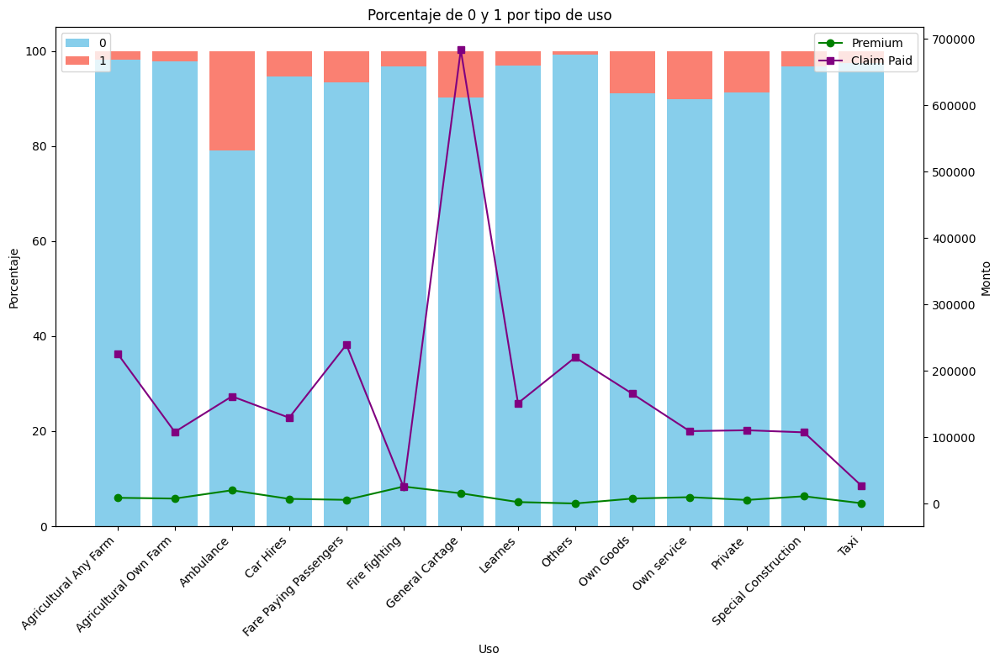

In [216]:
import numpy as np
import matplotlib.pyplot as plt

# Datos
usages = ['Agricultural Any Farm', 'Agricultural Own Farm', 'Ambulance', 'Car Hires',
          'Fare Paying Passengers', 'Fire fighting', 'General Cartage', 'Learnes',
          'Others', 'Own Goods', 'Own service', 'Private', 'Special Construction', 'Taxi']
valores_0 = [98.08, 97.87, 79.10, 94.70, 93.43, 96.77, 90.26, 97.00, 99.30, 91.10, 89.84, 91.25, 96.76, 97.41]
valores_1 = [1.92, 2.13, 20.90, 5.30, 6.57, 3.23, 9.74, 3.00, 0.70, 8.90, 10.16, 8.75, 3.24, 2.59]
premium = [9081.850855, 7938.395001, 20436.213347, 7457.342530, 6007.032508, 26014.824516,
           15864.039432, 2671.255201, 529.875890, 7912.985405, 10037.274885, 5833.081517,
           11404.932547, 954.449766]
claim_paid = [226137.746750, 108227.852200, 161846.136812, 129611.085397, 239613.016958,
              25242.500000, 683333.079487, 151568.811591, 220421.199444, 165669.659314,
              109434.950730, 110768.315083, 107602.721000, 27625.253536]

# Configuración del gráfico
fig, ax1 = plt.subplots(figsize=(12, 8))

# Eje izquierdo: Porcentaje de 0 y 1
ax1.bar(usages, valores_0, label='0', color='skyblue')
ax1.bar(usages, valores_1, bottom=valores_0, label='1', color='salmon')

# Etiquetas y título
ax1.set_ylabel('Porcentaje')
ax1.set_xlabel('Uso')
ax1.set_title('Porcentaje de 0 y 1 por tipo de uso')
ax1.set_xticklabels(usages, rotation=45, ha='right')

# Eje derecho: Premium y Claim Paid
ax2 = ax1.twinx()
ax2.plot(usages, premium, label='Premium', color='green', marker='o')
ax2.plot(usages, claim_paid, label='Claim Paid', color='purple', marker='s')
ax2.set_ylabel('Monto')
ax2.grid(False)

# Leyenda
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

Se observa que la mayoría de los tipos de uso de vehículos tienen una prima de seguro similar, con la excepción de los bomberos, quienes pagan un poco más. Sin embargo, destacan por tener un índice de accidentabilidad bajo y un promedio de desembolso en accidentes relativamente bajo. Por otro lado, la cartera general presenta el valor más alto de desembolso. Las ambulancias muestran el índice de accidentabilidad más alto, mientras que los pasajeros que pagan tarifa también tienen un alto índice de desembolso.

### 3.2.4 FECHAS

In [199]:
df


df['Duracion_Poliza'] = (df['INSR_END'] - df['INSR_BEGIN']).dt.days

# Crear una serie de tiempo que contenga todos los días cubiertos por las pólizas
fechas = pd.date_range(start=df['INSR_BEGIN'].min(), end=df['INSR_END'].max(), freq='D')

# Agregar las fechas al DataFrame
df_fechas = pd.DataFrame({'Fecha': fechas})

# Unir el DataFrame de fechas con el DataFrame original
df_merged = pd.merge(df_fechas, df, how='left', left_on='Fecha', right_on='INSR_BEGIN')

# Llenar los valores nulos en 'Monto_Pagado' con 0
df_merged['CLAIM_PAID'] = df_merged['CLAIM_PAID'].fillna(0)

# Agrupar los datos por día y sumar el monto pagado por los asegurados en cada día
gasto_por_dia = df_merged.groupby('Fecha')['CLAIM_PAID'].sum()

# Identificar los 10 días con el mayor gasto
mayores_gastos = gasto_por_dia.nlargest(10)

print("Los 10 días con mayor gasto son:")
print(mayores_gastos)

Los 10 días con mayor gasto son:
Fecha
2016-07-08    2.931992e+08
2015-07-08    2.835169e+08
2014-07-08    2.584032e+08
2017-07-08    2.093455e+08
2014-07-01    1.108060e+08
2016-07-01    9.873966e+07
2016-01-01    9.662061e+07
2015-07-01    9.055997e+07
2015-02-05    8.761380e+07
2015-08-08    8.583784e+07
Name: CLAIM_PAID, dtype: float64


<ipython-input-199-0b75ecdc3654>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Parece ser que julio es el mes donde mayor dinero desembolsa la aseguradora

In [201]:

# Calcular la suma de reclamaciones pagadas por fecha de duración de póliza
suma_reclamaciones = df.groupby('Duracion_Poliza')['CLAIM_PAID'].sum()

# Calcular el número de reclamaciones por fecha de duración de póliza
cantidad_reclamaciones = df.groupby('Duracion_Poliza').size()

# Combinar los resultados en un DataFrame
resultados = pd.DataFrame({'Suma_Reclamaciones': suma_reclamaciones, 'Cantidad_Reclamaciones': cantidad_reclamaciones})

# Ordenar en orden descendente por la suma de reclamaciones
resultados = resultados.sort_values(by='Suma_Reclamaciones', ascending=False)

# Imprimir los resultados
print(resultados.head(10))

                 Suma_Reclamaciones  Cantidad_Reclamaciones
Duracion_Poliza                                            
364                    5.222548e+09                  279564
365                    2.540623e+09                  110303
183                    1.117999e+08                    2147
182                    1.029002e+08                    2534
181                    5.451140e+07                    1279
180                    3.559981e+07                    1104
2                      6.228597e+06                     891
358                    4.495056e+06                      18
175                    4.410391e+06                       3
357                    3.089157e+06                      99


Las pólizas con una duración de un año son las que generan la mayor cantidad de desembolsos en conjunto. No obstante, resulta notable el hecho de que las pólizas de dos días y las de 175 días, al ser fechas puntuales, generan un volumen significativo de gastos salientes.

### 3.2.3 TYPE_VEHICLE

In [217]:
# por tipo de medio
tabla_dinamica = pd.crosstab(df['TYPE_VEHICLE'], df['RECLAMO'], margins=True, margins_name='Total')

tabla_dinamica

RECLAMO,0,1,Total
TYPE_VEHICLE,,,
Automobile,52439,5021,57460
Bus,45746,6683,52429
Motor-cycle,77648,478,78126
Pick-up,66870,8047,74917
Special construction,6640,568,7208
Station Wagones,26464,4023,30487
Tanker,5464,332,5796
Tractor,6440,138,6578
Trade plates,4,0,4


In [218]:
tabla_dinamica = pd.crosstab(df['TYPE_VEHICLE'], df['RECLAMO'], normalize='index') * 100
tabla_dinamica = tabla_dinamica.round(2)  # Redondear los porcentajes a 2 decimales
tabla_dinamica

RECLAMO,0,1
TYPE_VEHICLE,,
Automobile,91.26,8.74
Bus,87.25,12.75
Motor-cycle,99.39,0.61
Pick-up,89.26,10.74
Special construction,92.12,7.88
Station Wagones,86.80,13.20
Tanker,94.27,5.73
Tractor,97.90,2.10
Trade plates,100.00,0.00


In [219]:
tabla1 = df.groupby('TYPE_VEHICLE')['PREMIUM'].mean().reset_index() # CUOTA QUE PAGAN

print(tabla1)

                 TYPE_VEHICLE       PREMIUM
0                  Automobile   3475.431788
1                         Bus  11821.966467
2                 Motor-cycle    574.546203
3                     Pick-up   6887.424048
4        Special construction  12571.422544
5             Station Wagones  13183.844011
6                      Tanker  17206.841982
7                     Tractor   8232.531664
8                Trade plates    592.925000
9   Trailers and semitrailers   6880.333141
10                      Truck  14984.777329


In [220]:
tabla2 = df.groupby('TYPE_VEHICLE')['CLAIM_PAID'].mean().reset_index()# PROMEDIO DE PAGO REALIZADO

print(tabla2)


                 TYPE_VEHICLE     CLAIM_PAID
0                  Automobile   85117.265061
1                         Bus  184233.588758
2                 Motor-cycle   38857.155502
3                     Pick-up  152048.380175
4        Special construction  212904.407570
5             Station Wagones  143490.054052
6                      Tanker  441672.165120
7                     Tractor  138665.968551
8                Trade plates            NaN
9   Trailers and semitrailers  655556.078744
10                      Truck  551689.223162


In [221]:
#tabla_final = pd.concat([tabla_dinamica, tabla1, tabla2], axis=0)
tabla_final = tabla_dinamica.merge(tabla1, on='TYPE_VEHICLE').merge(tabla2, on='TYPE_VEHICLE')
print(tabla_final)

                 TYPE_VEHICLE       0      1       PREMIUM     CLAIM_PAID
0                  Automobile   91.26   8.74   3475.431788   85117.265061
1                         Bus   87.25  12.75  11821.966467  184233.588758
2                 Motor-cycle   99.39   0.61    574.546203   38857.155502
3                     Pick-up   89.26  10.74   6887.424048  152048.380175
4        Special construction   92.12   7.88  12571.422544  212904.407570
5             Station Wagones   86.80  13.20  13183.844011  143490.054052
6                      Tanker   94.27   5.73  17206.841982  441672.165120
7                     Tractor   97.90   2.10   8232.531664  138665.968551
8                Trade plates  100.00   0.00    592.925000            NaN
9   Trailers and semitrailers   94.95   5.05   6880.333141  655556.078744
10                      Truck   90.93   9.07  14984.777329  551689.223162


<ipython-input-222-f73bc10ed2ea>:26: UserWarning:

FixedFormatter should only be used together with FixedLocator



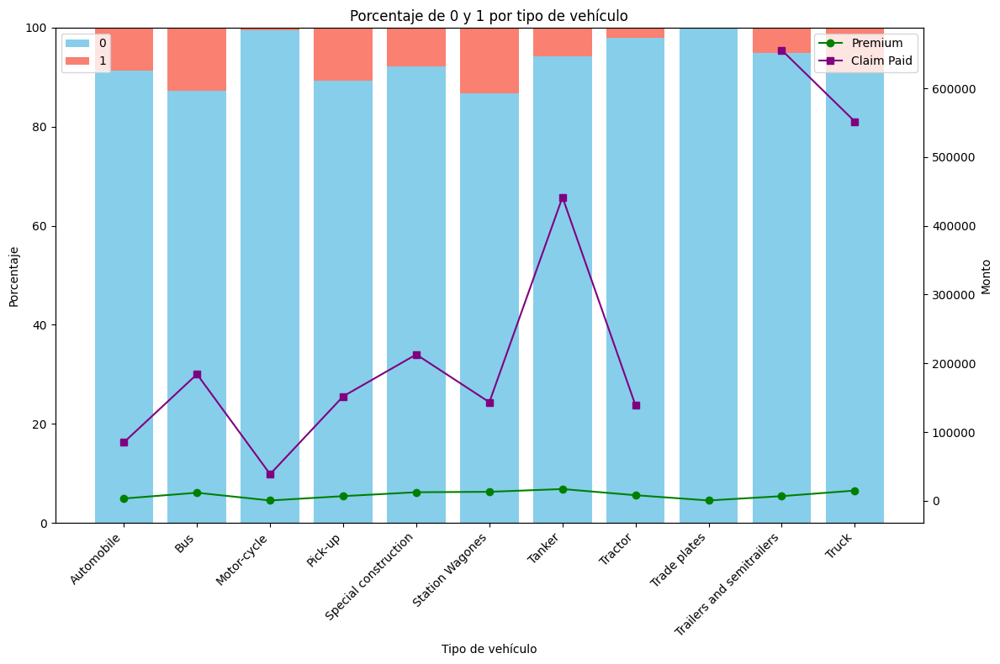

In [222]:
import numpy as np
import matplotlib.pyplot as plt

# Datos
tipos_vehiculo = ['Automobile', 'Bus', 'Motor-cycle', 'Pick-up', 'Special construction',
                  'Station Wagones', 'Tanker', 'Tractor', 'Trade plates',
                  'Trailers and semitrailers', 'Truck']
valores_0 = [91.26, 87.25, 99.39, 89.26, 92.12, 86.80, 94.27, 97.90, 100.00, 94.95, 90.93]
valores_1 = [8.74, 12.75, 0.61, 10.74, 7.88, 13.20, 5.73, 2.10, 0.00, 5.05, 9.07]
premium = [3475.431788, 11821.960833, 574.545679, 6887.423886, 12571.399477,
           13183.842128, 17206.841982, 8232.522923, 592.925000, 6880.333141, 14984.777329]
claim_paid = [85117.265061, 184233.588758, 38857.155502, 152048.380175, 212904.407570,
              143490.054052, 441672.165120, 138665.968551, float('nan'), 655556.078744, 551689.223162]

# Configuración del gráfico
fig, ax1 = plt.subplots(figsize=(12, 8))

# Eje izquierdo: Porcentaje de 0 y 1
ax1.bar(tipos_vehiculo, valores_0, label='0', color='skyblue')
ax1.bar(tipos_vehiculo, valores_1, bottom=valores_0, label='1', color='salmon')

# Etiquetas y título
ax1.set_ylabel('Porcentaje')
ax1.set_xlabel('Tipo de vehículo')
ax1.set_title('Porcentaje de 0 y 1 por tipo de vehículo')
ax1.set_xticklabels(tipos_vehiculo, rotation=45, ha='right')

# Eje derecho: Premium y Claim Paid
ax2 = ax1.twinx()
ax2.plot(tipos_vehiculo, premium, label='Premium', color='green', marker='o')
ax2.plot(tipos_vehiculo, claim_paid, label='Claim Paid', color='purple', marker='s')
ax2.set_ylabel('Monto')
ax2.grid(False)

# Leyenda
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()


Resulta llamativo que, a pesar de que todos los tipos de vehículos tienen primas de seguro similares, existe una considerable variación en los desembolsos, siendo más altos para los tanques y remolques. Estos dos últimos deberían tener primas más elevadas. Además, destaca la alta tasa de accidentes de las camionetas familiares, mientras que las motocicletas muestran tanto una baja tasa de accidentes como bajos desembolsos.

#### 3.2.3.1 AUTOS

dado que la mayoria de las marcas son Toyota se hace un zoom en autos

In [223]:
top_10_marcas = df['MAKE'].value_counts().head(10).index.tolist()
top_10_marcas

['TOYOTA',
 'BAJAJ',
 'ISUZU',
 'NISSAN',
 'SINO',
 'IVECO',
 'MITSUBISHI',
 'BISHOFTU',
 'YAMAHA',
 'TVS']

In [224]:
df['Number_of_Cars'] = df.groupby('MAKE')['MAKE'].transform('count')

# Filtrar por tipo de vehículo "car"
df_car = df[df['TYPE_VEHICLE'] == 'Automobile']

# Obtener las 10 primeras marcas de autos dentro de los "car"
top_10_brands_car = df_car['MAKE'].value_counts().head(10).index.tolist()

# Filtrar el DataFrame original para incluir solo las 10 primeras marcas de autos dentro de los "car"
df_filtered = df[df['MAKE'].isin(top_10_brands_car)]

# Calcular el porcentaje de accidentes por marca de auto
accidents_percentage = df_filtered.groupby('MAKE')['RECLAMO'].mean() * 100

# Calcular el promedio del seguro pagado por marca de auto
average_insurance_paid = df_filtered.groupby('MAKE')['PREMIUM'].mean()

# Calcular el promedio del valor pagado por la aseguradora por marca de auto
average_claim_paid = df_filtered[df_filtered['RECLAMO'] == 1].groupby('MAKE')['CLAIM_PAID'].mean()

# Crear un nuevo DataFrame con los resultados
results = pd.DataFrame({
    'Accidents_Percentage': accidents_percentage,
    'Average_Insurance_Paid': average_insurance_paid,
    'Average_Claim_Paid': average_claim_paid,
    'Number_of_Cars': df_filtered.groupby('MAKE')['Number_of_Cars'].first()
})

# Mostrar los resultados
print(results)

<ipython-input-224-bf38f796a64b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



            Accidents_Percentage  Average_Insurance_Paid  Average_Claim_Paid  \
MAKE                                                                           
GEELY                  18.340611             3281.369152        45656.788056   
HYUNDAI                11.331100             7188.879396       139690.775511   
LADA                    3.591160              808.397263        26605.447981   
LIFAN                  12.991559             2757.107331        61414.066403   
MERCEDES                6.692573            11540.118810       296041.849355   
MITSUBISHI              9.979514             6060.967742       185201.218260   
NISSAN                 10.377609             9007.823262       182017.637508   
SUZUKI                  2.684682             1599.993961        56208.957843   
TOYOTA                 11.002920             8130.763992       160339.477934   
VITZ                    8.754624             2567.343933       148930.206972   

            Number_of_Cars  
MAKE      

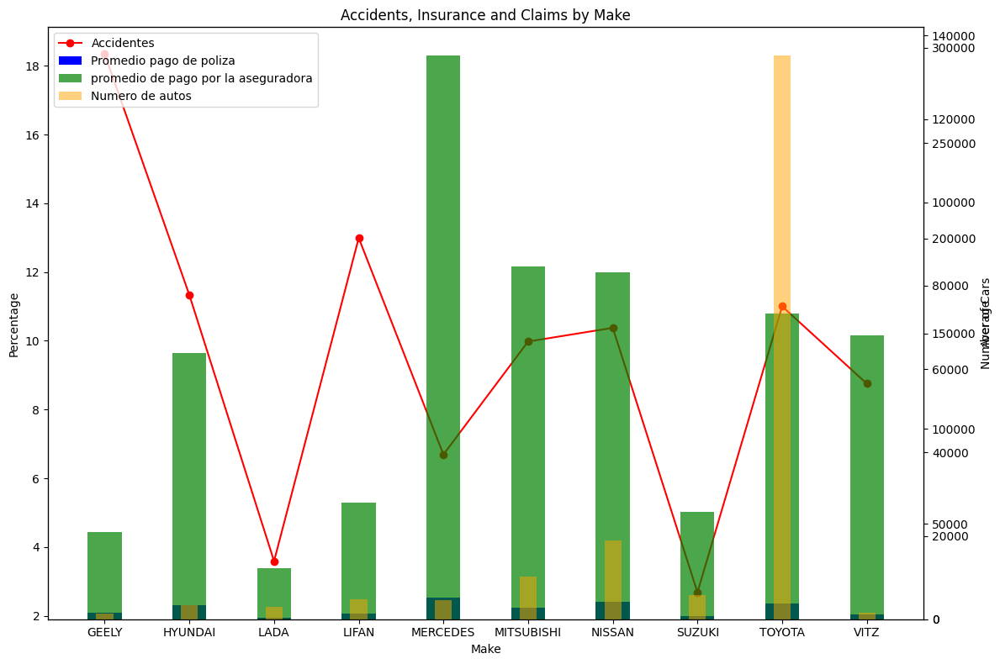

In [225]:
import matplotlib.pyplot as plt
import numpy as np

# Datos
makes = ['GEELY', 'HYUNDAI', 'LADA', 'LIFAN', 'MERCEDES', 'MITSUBISHI', 'NISSAN', 'SUZUKI', 'TOYOTA', 'VITZ']
accidents_percentage = [18.340611, 11.331100, 3.591160, 12.991559, 6.692573, 9.979514, 10.377609, 2.684682, 11.002920, 8.754624]
average_insurance_paid = [3281.369152, 7188.879396, 808.397263, 2757.107331, 11540.118810, 6060.967742, 9007.823262, 1599.993961, 8130.763478, 2567.343933]
average_claim_paid = [45656.788056, 139690.775511, 26605.447981, 61414.066403, 296041.849355, 185201.218260, 182017.637508, 56208.957843, 160339.477934, 148930.206972]
number_of_cars = [1374, 3283, 2896, 4857, 4632, 10251, 18829, 5699, 135255, 1622]

# Configurar el gráfico
fig, ax1 = plt.subplots(figsize=(12, 8))

# Porcentaje de accidentes (línea)
ax1.plot(makes, accidents_percentage, color='red', marker='o', label='Accidentes')

# Promedio del seguro pagado
ax2 = ax1.twinx()
ax2.bar(makes, average_insurance_paid, width=0.4, color='blue', label='Promedio pago de poliza')

# Promedio del valor pagado por la aseguradora
ax2.bar(makes, average_claim_paid, width=0.4, color='green', alpha=0.7, label='promedio de pago por la aseguradora')

# Cantidad de autos por marca (barra)
ax3 = ax1.twinx()
ax3.bar(makes, number_of_cars, width=0.2, color='orange', alpha=0.5, label='Numero de autos')

# Ajustes de diseño
ax1.set_xlabel('Make')
ax1.set_ylabel('Percentage')
ax2.set_ylabel('Average')
ax3.set_ylabel('Number of Cars')
ax1.set_title('Accidents, Insurance and Claims by Make')

# Leyenda
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
ax1.legend(lines + lines2 + lines3, labels + labels2 + labels3, loc='upper left')

# Ajuste de diseño
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Los vehículos Geely muestran consistentemente una tasa de accidentabilidad alta, mientras que los Mercedes presentan un promedio de desembolso superior al de otras marcas, lo que sugiere la necesidad de una prima de seguro más alta para estos modelos. Por otro lado, Nissan y Toyota tienen un promedio de prima de seguro similar al de Mercedes, pero registran un promedio de desembolso mucho menor. Esto indica que poseer autos Toyota es una opción favorable en comparación con los Mercedes, ya que ofrecen un menor riesgo de gastos asociados a accidentes.

#### 3.2.3.2 MOTOS

se decide hacer zoom en las motos tambien pues son el medio de mayor uso y tienen buenos numeros en cuanto accidentabilidad y desembolsos

In [226]:
df['Number_of_Cars'] = df.groupby('MAKE')['MAKE'].transform('count')

# Filtrar por tipo de vehículo "car"
df_car = df[df['TYPE_VEHICLE'] == 'Motor-cycle']

# Obtener las 10 primeras marcas de autos dentro de los "car"
top_10_brands_car = df_car['MAKE'].value_counts().head(10).index.tolist()

# Filtrar el DataFrame original para incluir solo las 10 primeras marcas de autos dentro de los "car"
df_filtered = df[df['MAKE'].isin(top_10_brands_car)]

# Calcular el porcentaje de accidentes por marca de auto
accidents_percentage = df_filtered.groupby('MAKE')['RECLAMO'].mean() * 100

# Calcular el promedio del seguro pagado por marca de auto
average_insurance_paid = df_filtered.groupby('MAKE')['PREMIUM'].mean()

# Calcular el promedio del valor pagado por la aseguradora por marca de auto
average_claim_paid = df_filtered[df_filtered['RECLAMO'] == 1].groupby('MAKE')['CLAIM_PAID'].mean()

# Crear un nuevo DataFrame con los resultados
results = pd.DataFrame({
    'Accidents_Percentage': accidents_percentage,
    'Average_Insurance_Paid': average_insurance_paid,
    'Average_Claim_Paid': average_claim_paid,
    'Number_of_Cars': df_filtered.groupby('MAKE')['Number_of_Cars'].first()
})

# Mostrar los resultados
print(results)

<ipython-input-226-8db7487e8cbb>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



          Accidents_Percentage  Average_Insurance_Paid  Average_Claim_Paid  \
MAKE                                                                         
BAJAJ                 0.564012              450.031560        31441.366139   
BMW                   1.575456             3810.357703       581492.195789   
BOXER                 0.247770              327.129438        15828.039000   
FORCE                 1.893096              723.069864        15954.222353   
LIFAN                12.991559             2757.107331        61414.066403   
PLATENA               0.000000              363.878423                 NaN   
SUZUKI                2.684682             1599.993961        56208.957843   
TVS                   0.690521              432.684492        17930.293818   
YAMAHA                0.651346             1062.225372        67291.107170   
ZONGSHEN              0.487805              378.861081         3500.000000   

          Number_of_Cars  
MAKE                      
BAJAJ    

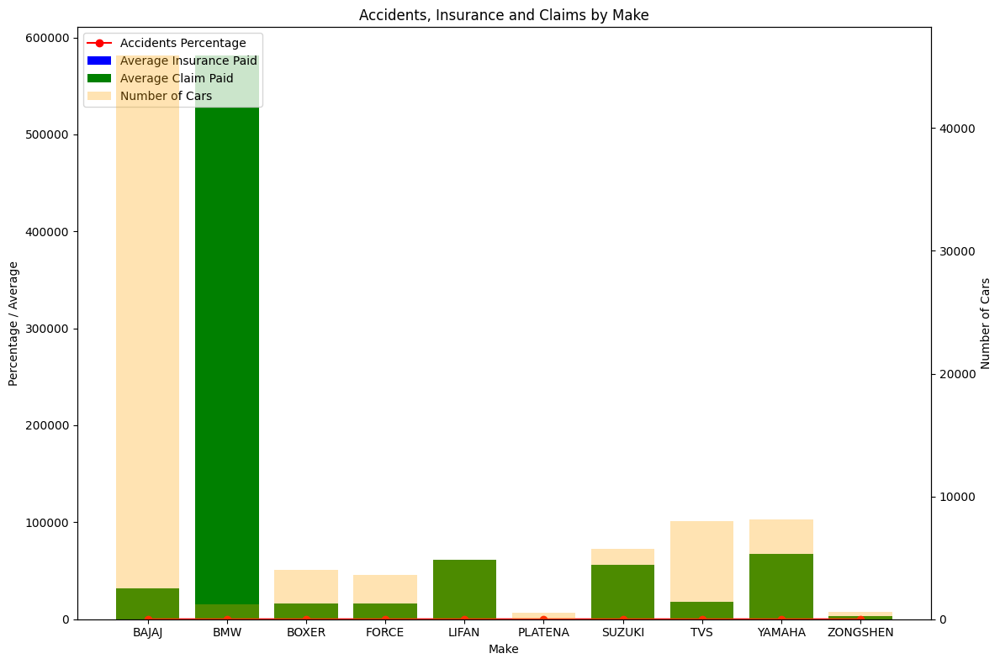

In [227]:
import matplotlib.pyplot as plt
import numpy as np

# Datos
makes = ['BAJAJ', 'BMW', 'BOXER', 'FORCE', 'LIFAN', 'PLATENA', 'SUZUKI', 'TVS', 'YAMAHA', 'ZONGSHEN']
accidents_percentage = [0.564012, 1.575456, 0.247770, 1.893096, 12.991559, 0.000000, 2.684682, 0.690521, 0.651346, 0.487805]
average_insurance_paid = [450.031560, 3810.357703, 327.129438, 723.069864, 2757.107331, 363.878423, 1599.993961, 432.682690, 1062.222109, 378.861081]
average_claim_paid = [31441.366139, 581492.195789, 15828.039000, 15954.222353, 61414.066403, np.nan, 56208.957843, 17930.293818, 67291.107170, 3500.000000]
number_of_cars = [45921, 1206, 4036, 3592, 4857, 527, 5699, 7965, 8137, 615]

# Configurar el gráfico
fig, ax1 = plt.subplots(figsize=(12, 8))

# Porcentaje de accidentes (línea)
ax1.plot(makes, accidents_percentage, color='red', marker='o', label='Accidents Percentage')

# Promedio del seguro pagado
ax1.bar(makes, average_insurance_paid, label='Average Insurance Paid', color='blue')

# Promedio del valor pagado por la aseguradora
ax1.bar(makes, average_claim_paid, label='Average Claim Paid', color='green')

# Número de autos por marca
ax2 = ax1.twinx()
ax2.bar(makes, number_of_cars, alpha=0.3, label='Number of Cars', color='orange')

# Etiquetas y título
ax1.set_xlabel('Make')
ax1.set_ylabel('Percentage / Average')
ax2.set_ylabel('Number of Cars')
ax1.set_title('Accidents, Insurance and Claims by Make')

# Leyenda
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

# Ajuste de diseño
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Se evidencia un bajo indice de pago de polizas y de accidentabilidad, resalta la cantidad de motos Bajaj y el desembolso promedio de las motos BMW, estas deberian tener una poliza de mayor valor